In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!cd /content/drive/MyDrive/thesis

In [ ]:
!unzip "/content/drive/MyDrive/thesis/bigger_data.zip"

In [ ]:
!unzip "/content/drive/MyDrive/thesis/smaller_data.zip"

##dataset handling

In [ ]:
import os
import random
import shutil
"""
# Paths to the big folders and the new empty folders
big_folder_paths = ['/content/drive/MyDrive/thesis/bigger_data/Training/glioma', '/content/drive/MyDrive/thesis/bigger_data/Training/meningioma', '/content/drive/MyDrive/thesis/bigger_data/Training/notumor', '/content/drive/MyDrive/thesis/bigger_data/Training/pituitary']
new_folder_paths = ['/content/drive/MyDrive/thesis/final_data/glioma', '/content/drive/MyDrive/thesis/final_data/meningioma', '/content/drive/MyDrive/thesis/final_data/no_tumor', '/content/drive/MyDrive/thesis/final_data/pituitary']

# Number of images to select from each big folder
num_images_to_select = 450

# Iterate over each big folder
for i, big_folder_path in enumerate(big_folder_paths):
    # Create the new folder if it doesn't exist
    new_folder_path = new_folder_paths[i]
    if not os.path.exists(new_folder_path):
        os.makedirs(new_folder_path)

    # Get a list of all image files in the big folder
    image_files = [f for f in os.listdir(big_folder_path) if os.path.isfile(os.path.join(big_folder_path, f))]

    # Randomly select num_images_to_select images
    selected_images = random.sample(image_files, min(num_images_to_select, len(image_files)))

    # Move selected images to the new folder
    for image_file in selected_images:
        src = os.path.join(big_folder_path, image_file)
        dst = os.path.join(new_folder_path, image_file)
        shutil.copy(src, dst)
"""

In [ ]:
# convert all notumor into greyscale (1 dimensional)
"""
import cv2
import os

def convert_to_grayscale(input_folder, output_folder):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get the list of files in the input folder
    files = os.listdir(input_folder)

    # Loop through each file
    for file in files:
        # Read the image
        image_path = os.path.join(input_folder, file)
        image = cv2.imread(image_path)

        # Convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Save the grayscale image
        output_path = os.path.join(output_folder, file)
        cv2.imwrite(output_path, gray_image)

# Convert the images to grayscale
convert_to_grayscale('/content/drive/MyDrive/thesis/final_data/glioma', '/content/drive/MyDrive/thesis/final_data/glioma_grey')
convert_to_grayscale('/content/drive/MyDrive/thesis/final_data/meningioma', '/content/drive/MyDrive/thesis/final_data/meningioma_grey')
convert_to_grayscale('/content/drive/MyDrive/thesis/final_data/no_tumor', '/content/drive/MyDrive/thesis/final_data/no_tumor_grey')
convert_to_grayscale('/content/drive/MyDrive/thesis/final_data/pituitary', '/content/drive/MyDrive/thesis/final_data/pituitary_grey')
"""


In [5]:
import os, glob
import numpy as np
from skimage.io import imread

# reading and processing of folders of MRI images

glioma= "/content/drive/MyDrive/thesis/final_data/glioma_grey"
meningioma = "/content/drive/MyDrive/thesis/final_data/meningioma_grey"
no_tumor = "/content/drive/MyDrive/thesis/final_data/no_tumor_grey"
pituitary = "/content/drive/MyDrive/thesis/final_data/pituitary_grey"

gliomalist = list(glob.iglob(os.path.join(glioma, "**/*"), recursive=True))
meningiomalist = list(glob.iglob(os.path.join(meningioma, "**/*"), recursive=True))
no_tumorlist = list(glob.iglob(os.path.join(no_tumor, "**/*"), recursive=True))
pituitarylist = list(glob.iglob(os.path.join(pituitary, "**/*"), recursive=True))
print(f"glioma images: {len(gliomalist)}")
print(f"miningioma images: {len(meningiomalist)}")
print(f"no tumor images: {len(no_tumorlist)}")
print(f"pituitary images: {len(pituitarylist)}")


im = imread("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
print(im.shape)


glioma images: 450
miningioma images: 450
no tumor images: 450
pituitary images: 450
(512, 512)


In [6]:
from sklearn.model_selection import train_test_split

#train and test splitting
X = gliomalist + meningiomalist + no_tumorlist + pituitarylist
y = ['glioma'] * len(gliomalist) + ['meningioma'] * len(meningiomalist) + ['no_tumor'] * len(no_tumorlist) + ['pituitary'] * len(pituitarylist)
print(f"Length of X: {len(X)}. Length of y: {len(y)}")
X_train, X_test, y_train, y_test = train_test_split(
X,
y,
test_size=0.2,
shuffle=True,
random_state=42,
)
print(f"Length of X_train: {len(X_train)}. Length of y_train: {len(y_train)}")
print(f"Length of X_test: {len(X_test)}. Length of y_test: {len(y_test)}")

Length of X: 1800. Length of y: 1800
Length of X_train: 1440. Length of y_train: 1440
Length of X_test: 360. Length of y_test: 360


(64, 64)
(64, 64)


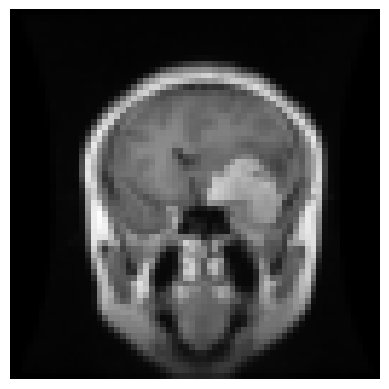

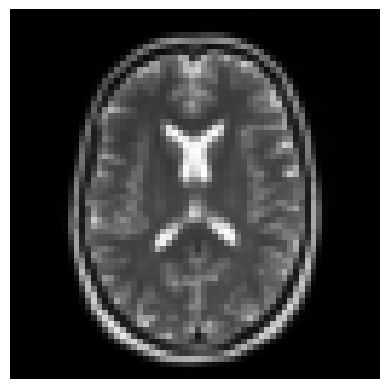

In [7]:

import os
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

def load_one_image(impath, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = rgb2gray(im)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Resize the image
    im = resize(im, (newsize, newsize))

    return im

one = load_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")
print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

##test majority classifier and randomise labels to check that data and code is correct

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []
# majority classifier only takes integers for y
y = [2] * len(gliomalist) + [2] * len(meningiomalist) + [0] * len(no_tumorlist) + [3] * len(pituitarylist)
for i in range(5):

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)

    # Assuming load_one_image function is defined
    Xdata_train = [load_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_one_image(impath).flatten() for impath in X_test]

    # Predict using majority class
    majority_class = np.bincount(y_train).argmax()
    predicted = np.full_like(y_test, majority_class)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted))

    # Calculate and store metrics
    precision_array.append(metrics.precision_score(y_test, predicted, average='weighted'))
    recall_array.append(metrics.recall_score(y_test, predicted, average='weighted'))
    f1_array.append(metrics.f1_score(y_test, predicted, average='weighted'))

# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        89
           2       0.52      1.00      0.68       186
           3       0.00      0.00      0.00        85

    accuracy                           0.52       360
   macro avg       0.17      0.33      0.23       360
weighted avg       0.27      0.52      0.35       360



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

Iteration 2 Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        87
           2       0.49      1.00      0.66       176
           3       0.00      0.00      0.00        97

    accuracy                           0.49       360
   macro avg       0.16      0.33      0.22       360
weighted avg       0.24      0.49      0.32       360



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

Iteration 3 Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        84
           2       0.49      1.00      0.66       176
           3       0.00      0.00      0.00       100

    accuracy                           0.49       360
   macro avg       0.16      0.33      0.22       360
weighted avg       0.24      0.49      0.32       360



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

Iteration 4 Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        88
           2       0.51      1.00      0.68       184
           3       0.00      0.00      0.00        88

    accuracy                           0.51       360
   macro avg       0.17      0.33      0.23       360
weighted avg       0.26      0.51      0.35       360



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

Iteration 5 Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        84
           2       0.52      1.00      0.68       186
           3       0.00      0.00      0.00        90

    accuracy                           0.52       360
   macro avg       0.17      0.33      0.23       360
weighted avg       0.27      0.52      0.35       360


Average Metrics:
Average Precision: 0.255
Average Recall: 0.504
Average F1-Score: 0.338


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classif

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics, svm
import numpy as np
import random

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(1):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)

    # Shuffle the labels
    random.shuffle(y_train)

    Xdata_train = [load_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted))

    # Calculate and store metrics
    precision_array.append(metrics.precision_score(y_test, predicted, average='weighted'))
    recall_array.append(metrics.recall_score(y_test, predicted, average='weighted'))
    f1_array.append(metrics.f1_score(y_test, predicted, average='weighted'))

# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")

Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.12      0.09      0.11        97
  meningioma       0.38      0.36      0.37        89
    no_tumor       0.25      0.26      0.26        89
   pituitary       0.13      0.16      0.14        85

    accuracy                           0.22       360
   macro avg       0.22      0.22      0.22       360
weighted avg       0.22      0.22      0.22       360


Average Metrics:
Average Precision: 0.219
Average Recall: 0.217
Average F1-Score: 0.216


##best SVM

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn import metrics, svm
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

# Split the train set further into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.125, shuffle=True, random_state=42)

# Define the parameter grid for GridSearchCV
param_grid = [
    {'kernel': ['linear'], 'class_weight': [None]},
    {'kernel': ['linear'], 'class_weight': ['balanced']},
    {'kernel': ['rbf'], 'class_weight': ['balanced']}
]

# Perform grid search with cross-validation
Xdata_train = [load_one_image(impath).flatten() for impath in X_train]
Xdata_val = [load_one_image(impath).flatten() for impath in X_val]
Xdata_test = [load_one_image(impath).flatten() for impath in X_test]
clf = GridSearchCV(svm.SVC(), param_grid, cv=5, scoring='f1_weighted')
clf.fit(Xdata_train, y_train)

# Get the best parameters
best_params = clf.best_params_

# Print the best parameters
print("Best Parameters:", best_params)

# Train the model with the best parameters on the full training set
best_clf = svm.SVC(**best_params)
best_clf.fit(Xdata_train, y_train)

# Predict on the validation set
predicted_val = best_clf.predict(Xdata_val)

# Print classification report for validation set
print("Validation Classification Report:")
print(metrics.classification_report(y_val, predicted_val))

# Calculate and store metrics
precision_val = metrics.precision_score(y_val, predicted_val, average='weighted')
recall_val = metrics.recall_score(y_val, predicted_val, average='weighted')
f1_val = metrics.f1_score(y_val, predicted_val, average='weighted')

# Print metrics for validation set
print(f"Validation Precision: {precision_val:.3f}")
print(f"Validation Recall: {recall_val:.3f}")
print(f"Validation F1-Score: {f1_val:.3f}")

# Predict on the test set
predicted_test = best_clf.predict(Xdata_test)

# Print classification report for test set
print("\nTest Classification Report:")
print(metrics.classification_report(y_test, predicted_test))

# Calculate and store metrics
precision_test = metrics.precision_score(y_test, predicted_test, average='weighted')
recall_test = metrics.recall_score(y_test, predicted_test, average='weighted')
f1_test = metrics.f1_score(y_test, predicted_test, average='weighted')

# Print metrics for test set
print(f"Test Precision: {precision_test:.3f}")
print(f"Test Recall: {recall_test:.3f}")
print(f"Test F1-Score: {f1_test:.3f}")

Best Parameters: {'class_weight': 'balanced', 'kernel': 'rbf'}
Validation Classification Report:
              precision    recall  f1-score   support

      glioma       0.82      0.66      0.73        47
  meningioma       0.65      0.74      0.69        47
    no_tumor       0.89      0.89      0.89        36
   pituitary       0.90      0.94      0.92        50

    accuracy                           0.81       180
   macro avg       0.81      0.81      0.81       180
weighted avg       0.81      0.81      0.81       180

Validation Precision: 0.811
Validation Recall: 0.806
Validation F1-Score: 0.805

Test Classification Report:
              precision    recall  f1-score   support

      glioma       0.82      0.87      0.84        92
  meningioma       0.83      0.70      0.76        90
    no_tumor       0.90      0.86      0.88        85
   pituitary       0.86      0.97      0.91        93

    accuracy                           0.85       360
   macro avg       0.85      0.85

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics, svm
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted))

    # Calculate and store metrics
    precision_array.append(metrics.precision_score(y_test, predicted, average='weighted'))
    recall_array.append(metrics.recall_score(y_test, predicted, average='weighted'))
    f1_array.append(metrics.f1_score(y_test, predicted, average='weighted'))

# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")

Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.83      0.73      0.78        97
  meningioma       0.72      0.75      0.74        89
    no_tumor       0.93      0.84      0.88        89
   pituitary       0.83      0.98      0.90        85

    accuracy                           0.82       360
   macro avg       0.83      0.83      0.82       360
weighted avg       0.83      0.82      0.82       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.79      0.79      0.79        96
  meningioma       0.70      0.70      0.70        80
    no_tumor       0.95      0.89      0.92        87
   pituitary       0.88      0.94      0.91        97

    accuracy                           0.83       360
   macro avg       0.83      0.83      0.83       360
weighted avg       0.83      0.83      0.83       360

Iteration 3 Classification Report:
              precision  

only for test run

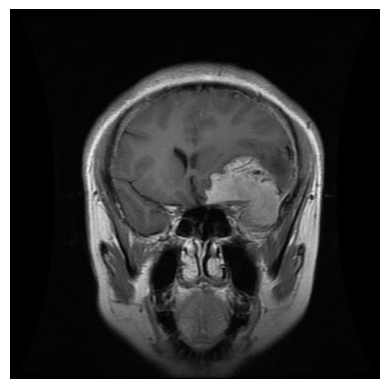

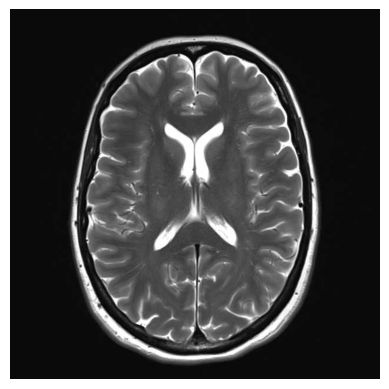

(512, 512)
(630, 630)


In [ ]:
import cv2
img1 = cv2.imread("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg", cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg", cv2.IMREAD_GRAYSCALE)

plt.imshow(img1, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(img2, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()
print(img1.shape)
print(img2.shape)

In [ ]:
!pip install colorcorrect

  Preparing metadata (setup.py) ... done
  Created wheel for colorcorrect: filename=colorcorrect-0.9.1-cp310-cp310-linux_x86_64.whl size=60677 sha256=625090b12a9e870b4962e603d472c3070847b8b6d463c3492ccfb51552d07bb2
  Stored in directory: /root/.cache/pip/wheels/c4/31/70/d73db628612c50b29dc363e9906eb76489e27e5f4d6439ac14
Successfully built colorcorrect


##methods from papers

##CLAHE
https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html

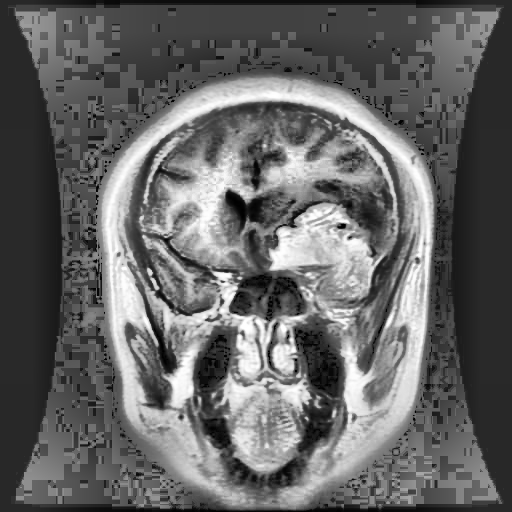

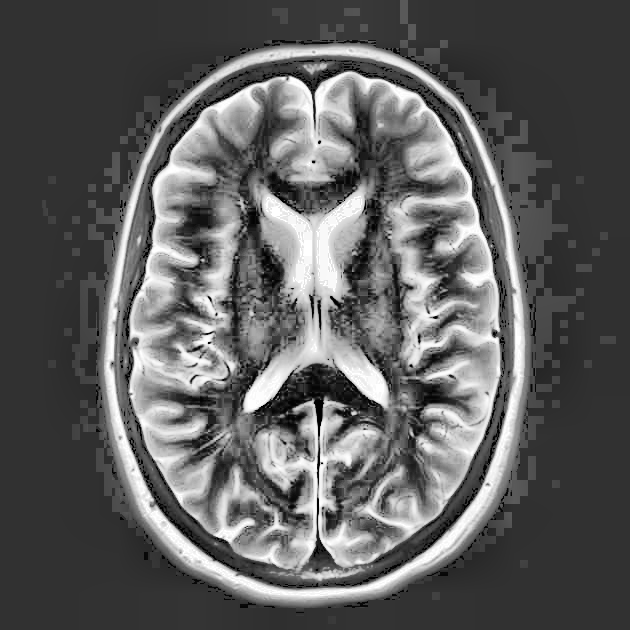

(512, 512)
(630, 630)


In [ ]:
from google.colab.patches import cv2_imshow

img1 = cv2.imread("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg", cv2.IMREAD_GRAYSCALE)
img2 = cv2.imread("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg", cv2.IMREAD_GRAYSCALE)
clahe = cv2.createCLAHE(clipLimit=40, tileGridSize=(8,8))
clahe_img1 = clahe.apply(img1)
clahe_img2 = clahe.apply(img2)

# Display the results
cv2_imshow(clahe_img1)
cv2_imshow(clahe_img2)
print(img1.shape)
print(img2.shape)

(64, 64)
(64, 64)


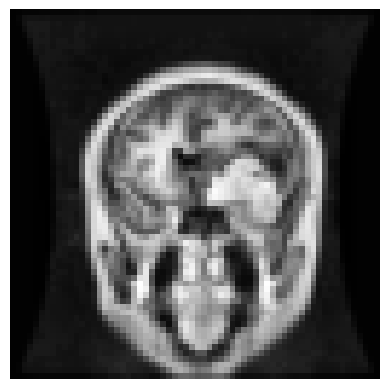

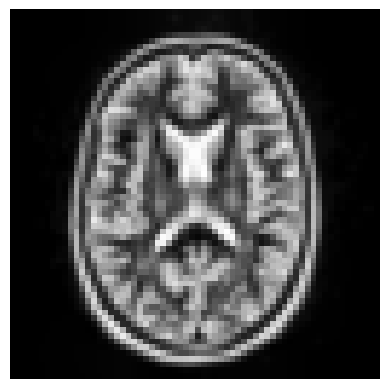

In [9]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import resize
from skimage import exposure
import matplotlib.pyplot as plt

def load_CLAHE_one_image(impath, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = rgb2gray(im)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Apply CLAHE filter
    im = exposure.equalize_adapthist(im, clip_limit=0.03)

    # Resize the image
    im = resize(im, (newsize, newsize))

    return im

one = load_CLAHE_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_CLAHE_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")
print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics, svm
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_CLAHE_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_CLAHE_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision_array.append(metrics.precision_score(y_test, predicted, average='weighted'))
    recall_array.append(metrics.recall_score(y_test, predicted, average='weighted'))
    f1_array.append(metrics.f1_score(y_test, predicted, average='weighted'))

# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")

Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.82      0.78      0.80        97
  meningioma       0.71      0.75      0.73        89
    no_tumor       0.91      0.83      0.87        89
   pituitary       0.88      0.95      0.92        85

    accuracy                           0.83       360
   macro avg       0.83      0.83      0.83       360
weighted avg       0.83      0.83      0.83       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.84      0.79      0.82        96
  meningioma       0.69      0.75      0.72        80
    no_tumor       0.96      0.92      0.94        87
   pituitary       0.91      0.94      0.92        97

    accuracy                           0.85       360
   macro avg       0.85      0.85      0.85       360
weighted avg       0.86      0.85      0.85       360

Iteration 3 Classification Report:
              precision  

## the laplace operator
https://docs.opencv.org/3.4/d5/db5/tutorial_laplace_operator.html

(64, 64)
(64, 64)


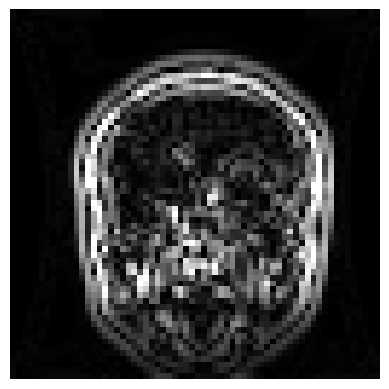

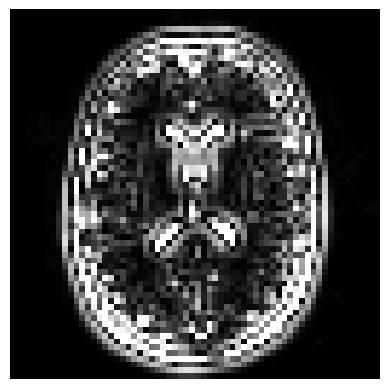

In [ ]:
import cv2 as cv
from skimage.io import imread
import numpy as np
import matplotlib.pyplot as plt

def load_lap_one_image(impath, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = cv.cvtColor(im, cv.COLOR_RGB2GRAY)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Resize the image
    im = cv.resize(im, (newsize, newsize))

    # Apply Laplacian filter
    im = cv.GaussianBlur(im, (3, 3), 0)  # Remove noise by blurring with a Gaussian filter
    im = cv.Laplacian(im, cv.CV_16S, ksize=3)  # Apply Laplace function
    im = cv.convertScaleAbs(im)  # converting back to uint8

    return im

one = load_lap_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_lap_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")
print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics, svm
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_lap_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_lap_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision_array.append(metrics.precision_score(y_test, predicted, average='weighted'))
    recall_array.append(metrics.recall_score(y_test, predicted, average='weighted'))
    f1_array.append(metrics.f1_score(y_test, predicted, average='weighted'))

# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.83      0.73      0.78        97
  meningioma       0.74      0.75      0.75        89
    no_tumor       0.91      0.90      0.90        89
   pituitary       0.85      0.96      0.91        85

    accuracy                           0.83       360
   macro avg       0.83      0.84      0.83       360
weighted avg       0.83      0.83      0.83       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.84      0.76      0.80        96
  meningioma       0.71      0.75      0.73        80
    no_tumor       0.97      0.97      0.97        87
   pituitary       0.88      0.92      0.90        97

    accuracy                           0.85       360
   macro avg       0.85      0.85      0.85       360
weighted avg       0.85      0.85      0.85       360

Iteration 3 Classification Report:
              precision  

##non local means filter

https://scikit-image.org/docs/stable/auto_examples/filters/plot_nonlocal_means.html

(64, 64)
(64, 64)


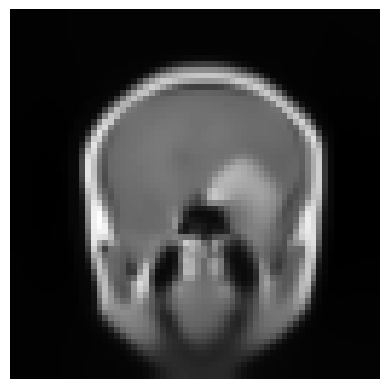

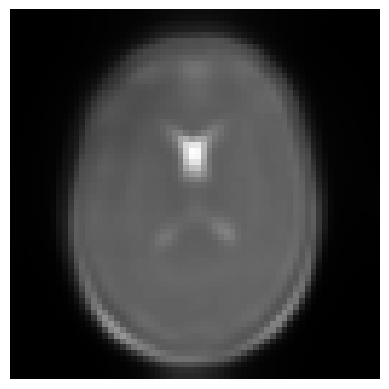

In [ ]:
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
from skimage.restoration import denoise_nl_means
import numpy as np

def load_nlm_one_image(impath,h_val, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = rgb2gray(im)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Resize the image
    im = resize(im, (newsize, newsize))

    # Apply Non-Linear Means filter
    im = denoise_nl_means(im, h=h_val * np.std(im))

    return im

one = load_nlm_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg",0.3)
two = load_nlm_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg",0.8)


print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_score.html

In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn import svm
import numpy as np
from collections import defaultdict

# Define the range of h values to search over
h_values = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]

# Initialize a dictionary to store metrics for each h value
h_metrics = defaultdict(list)

# Assuming X and y are your data and labels
for h_val in h_values:
    # Prepare your data with the current h_val
    Xdata = [load_nlm_one_image(impath, h_val).flatten() for impath in X]

    # Create an SVC model with the 'rbf' kernel and balanced class weights
    svc = svm.SVC(kernel='rbf', class_weight='balanced')

    # Use cross_val_score to evaluate the model with different h_vals
    scores = cross_val_score(svc, Xdata, y, cv=3, scoring='precision_weighted')

    # Calculate the average precision for the current h_val
    avg_precision = np.mean(scores)

    # Store the average precision for the current h_val
    h_metrics[h_val].append(avg_precision)

# Find the h value with the highest average precision
best_h_val = max(h_metrics, key=lambda k: np.mean(h_metrics[k]))
best_precision = np.mean(h_metrics[best_h_val])

print("\nBest h value with Highest Average precision:")
print(f"Best h value: {best_h_val}")
print(f"Corresponding precision: {best_precision:.3f}")



Best h value with Highest Average precision:
Best h value: 0.2
Corresponding precision: 0.809


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn import metrics, svm
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_nlm_one_image(impath,0.2).flatten() for impath in X_train]
    Xdata_test = [load_nlm_one_image(impath,0.2).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision_array.append(metrics.precision_score(y_test, predicted, average='weighted'))
    recall_array.append(metrics.recall_score(y_test, predicted, average='weighted'))
    f1_array.append(metrics.f1_score(y_test, predicted, average='weighted'))

# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.81      0.73      0.77        97
  meningioma       0.71      0.74      0.73        89
    no_tumor       0.92      0.82      0.87        89
   pituitary       0.83      0.98      0.90        85

    accuracy                           0.81       360
   macro avg       0.82      0.82      0.81       360
weighted avg       0.82      0.81      0.81       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.79      0.80      0.79        96
  meningioma       0.71      0.69      0.70        80
    no_tumor       0.95      0.90      0.92        87
   pituitary       0.88      0.93      0.90        97

    accuracy                           0.83       360
   macro avg       0.83      0.83      0.83       360
weighted avg       0.83      0.83      0.83       360

Iteration 3 Classification Report:
              precision  

##Log Polar Transformation (LPT)


https://scikit-image.org/docs/stable/api/skimage.transform.html#skimage.transform.warp_polar


(64, 64)
(64, 64)


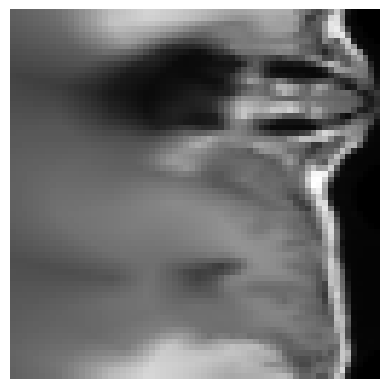

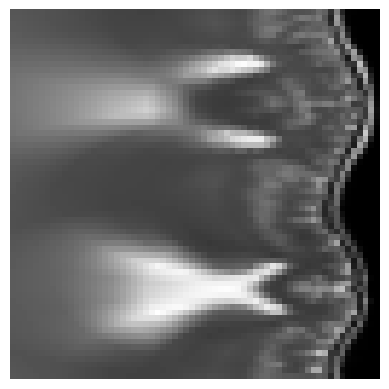

In [ ]:
from skimage.io import imread
from skimage.transform import resize, warp_polar
from skimage.color import rgb2gray
import numpy as np

def load_lpt_one_image(impath, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = rgb2gray(im)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Resize the image
    im = resize(im, (newsize, newsize))

    # Apply Log Polar Transformation
    im = warp_polar(im, radius=newsize/2, output_shape=(newsize, newsize), scaling='log')

    return im

one = load_lpt_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_lpt_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")

print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()


In [ ]:
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
import numpy as np
import pywt

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_lpt_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_lpt_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision = metrics.precision_score(y_test, predicted, average='weighted')
    recall = metrics.recall_score(y_test, predicted, average='weighted')
    f1 = metrics.f1_score(y_test, predicted, average='weighted')
    precision_array.append(precision)
    recall_array.append(recall)
    f1_array.append(f1)


# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.84      0.75      0.79        97
  meningioma       0.68      0.71      0.70        89
    no_tumor       0.88      0.80      0.84        89
   pituitary       0.82      0.96      0.89        85

    accuracy                           0.80       360
   macro avg       0.81      0.81      0.80       360
weighted avg       0.81      0.80      0.80       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.80      0.80      0.80        96
  meningioma       0.71      0.64      0.67        80
    no_tumor       0.88      0.90      0.89        87
   pituitary       0.89      0.95      0.92        97

    accuracy                           0.83       360
   macro avg       0.82      0.82      0.82       360
weighted avg       0.82      0.83      0.83       360

Iteration 3 Classification Report:
              precision  

##Discrete Wavelet Transformation (DWT)

https://pywavelets.readthedocs.io/en/latest/

In [ ]:
!pip install PyWavelets

horizontal detail of image
(64, 64)
(64, 64)


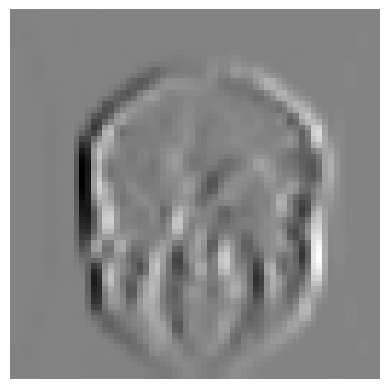

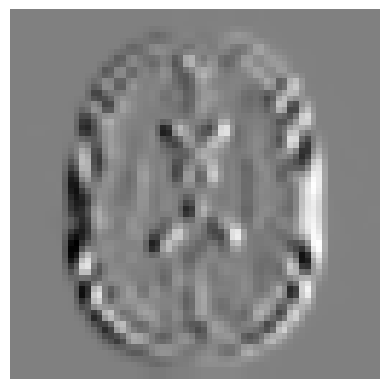

In [ ]:
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
import numpy as np
import pywt

def load_dwt_hor_one_image(impath, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = rgb2gray(im)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Resize the image
    im = resize(im, (newsize, newsize))

    # Apply Discrete Wavelet Transform
    coeffs = pywt.wavedec2(im, wavelet="haar", level=1)

    # Extract horizontal detail subband
    horizontal_detail = coeffs[1][1]  # Accessing the horizontal detail subband (level=1)

    # Resize the subband to match the new size
    horizontal_detail_resized = resize(horizontal_detail, (newsize, newsize))

    return horizontal_detail_resized

# Example usage
print("horizontal detail of image")
one = load_dwt_hor_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_dwt_hor_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")
print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()


In [ ]:
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_dwt_hor_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_dwt_hor_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision = metrics.precision_score(y_test, predicted, average='weighted')
    recall = metrics.recall_score(y_test, predicted, average='weighted')
    f1 = metrics.f1_score(y_test, predicted, average='weighted')
    precision_array.append(precision)
    recall_array.append(recall)
    f1_array.append(f1)


# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.70      0.71      0.70        97
  meningioma       0.67      0.63      0.65        89
    no_tumor       0.87      0.78      0.82        89
   pituitary       0.83      0.95      0.89        85

    accuracy                           0.76       360
   macro avg       0.77      0.77      0.76       360
weighted avg       0.76      0.76      0.76       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.70      0.76      0.73        96
  meningioma       0.66      0.59      0.62        80
    no_tumor       0.92      0.89      0.90        87
   pituitary       0.86      0.90      0.88        97

    accuracy                           0.79       360
   macro avg       0.79      0.78      0.78       360
weighted avg       0.79      0.79      0.79       360

Iteration 3 Classification Report:
              precision  

(64, 64)
(64, 64)


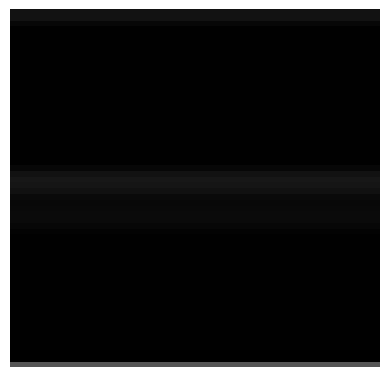

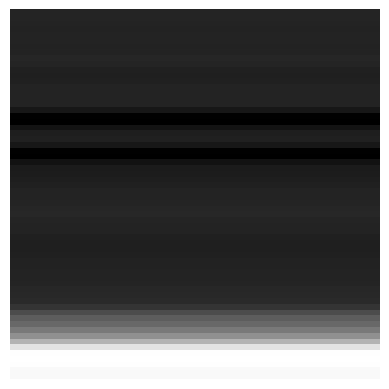

In [ ]:
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
import numpy as np
import pywt

def load_dwt_ver_one_image(impath, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = rgb2gray(im)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Resize the image
    im = resize(im, (newsize, newsize))

    # Apply Discrete Wavelet Transform
    coeffs = pywt.wavedec2(im, wavelet="haar", level=1)

    # Extract vertical detail subband
    vertical_detail = coeffs[0][1]  # Accessing the vertical detail subband (level=1)

    # Resize the subband to match the new size
    vertical_detail_resized = resize(vertical_detail, (newsize, newsize))

    return vertical_detail_resized

# Example usage
one = load_dwt_ver_one_image("/content/drive/MyDrive/thesis/new_data/notumor_grayscale/Copy of Tr-no_1093.jpg")
two = load_dwt_ver_one_image("/content/drive/MyDrive/thesis/new_data/tumor/Copy of Te-me_0227.jpg")
print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

In [ ]:
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_dwt_ver_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_dwt_ver_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='linear', class_weight=None)
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision = metrics.precision_score(y_test, predicted, average='weighted')
    recall = metrics.recall_score(y_test, predicted, average='weighted')
    f1 = metrics.f1_score(y_test, predicted, average='weighted')
    precision_array.append(precision)
    recall_array.append(recall)
    f1_array.append(f1)


# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.65      0.75        97
           1       0.69      0.89      0.77        83

    accuracy                           0.76       180
   macro avg       0.78      0.77      0.76       180
weighted avg       0.79      0.76      0.76       180

Iteration 2 Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.71      0.79        95
           1       0.73      0.91      0.81        85

    accuracy                           0.80       180
   macro avg       0.81      0.81      0.80       180
weighted avg       0.82      0.80      0.80       180

Iteration 3 Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.76      0.82        99
           1       0.75      0.89      0.81        81

    accuracy                           0.82       180
   macro avg       0.82

## log polar and DWT combined (same as paper)

(64, 64)
(64, 64)


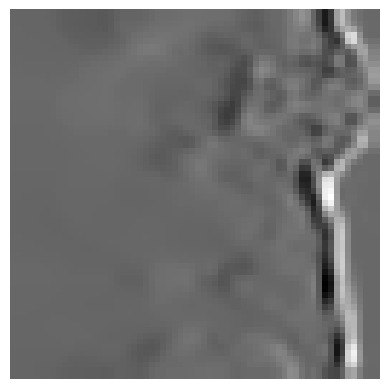

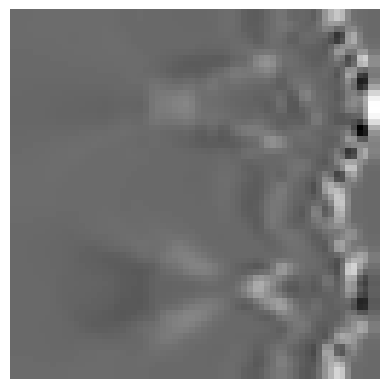

In [ ]:
from skimage.io import imread
from skimage.transform import resize, warp_polar
from skimage.color import rgb2gray
import numpy as np
import pywt

def load_lpt_dwt_one_image(impath, newsize=64):
    # Load the image
    im = imread(impath)

    # Check if the image is color
    if len(im.shape) == 3 and im.shape[2] == 3:  # Color image (RGB)
        # Convert to grayscale
        im = rgb2gray(im)
    elif len(im.shape) == 2:  # Grayscale image
        pass  # Do nothing if already grayscale
    else:
        raise ValueError("Unsupported image format")

    # Resize the image
    im = resize(im, (newsize, newsize))

    # Apply Log Polar Transformation
    im = warp_polar(im, radius=newsize/2, output_shape=(newsize, newsize), scaling='log')
    # Apply Discrete Wavelet Transform
    coeffs = pywt.wavedec2(im, wavelet="haar", level=1)

    # Extract horizontal detail subband
    horizontal_detail = coeffs[1][1]  # Accessing the horizontal detail subband (level=1)

    # Resize the subband to match the new size
    im = resize(horizontal_detail, (newsize, newsize))
    return im

one = load_lpt_dwt_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_lpt_dwt_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")
print(one.shape)
print(two.shape)
plt.imshow(one, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()

plt.imshow(two, cmap='gray')  # Displaying in grayscale
plt.axis('off')  # Hide axis
plt.show()


In [ ]:
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_lpt_dwt_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_lpt_dwt_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision = metrics.precision_score(y_test, predicted, average='weighted')
    recall = metrics.recall_score(y_test, predicted, average='weighted')
    f1 = metrics.f1_score(y_test, predicted, average='weighted')
    precision_array.append(precision)
    recall_array.append(recall)
    f1_array.append(f1)


# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.68      0.63      0.65        97
  meningioma       0.62      0.62      0.62        89
    no_tumor       0.89      0.76      0.82        89
   pituitary       0.78      0.96      0.86        85

    accuracy                           0.74       360
   macro avg       0.74      0.74      0.74       360
weighted avg       0.74      0.74      0.74       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.72      0.76      0.74        96
  meningioma       0.64      0.60      0.62        80
    no_tumor       0.92      0.83      0.87        87
   pituitary       0.84      0.92      0.88        97

    accuracy                           0.78       360
   macro avg       0.78      0.78      0.78       360
weighted avg       0.78      0.78      0.78       360

Iteration 3 Classification Report:
              precision  

##   BBHE
https://pypi.org/project/image-enhancement/

In [ ]:
!pip install image-enhancement

  Preparing metadata (setup.py) ... done
  Created wheel for image-enhancement: filename=image_enhancement-0.2.1-py3-none-any.whl size=13355 sha256=09633412661b21bf87515b78bcbddd6036a6c216bd0f7073f18b2f9f6418c379
  Stored in directory: /root/.cache/pip/wheels/00/5f/6d/c0107f17169f48357aebc3e52254fb16da23150300c70d89e6
Successfully built image-enhancement


(64, 64, 3)
(64, 64, 3)


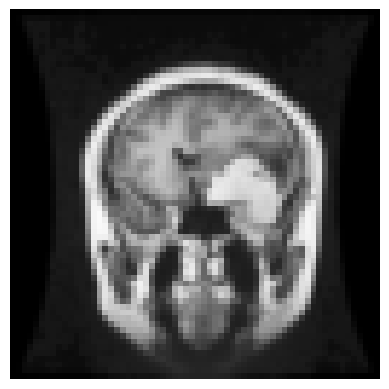

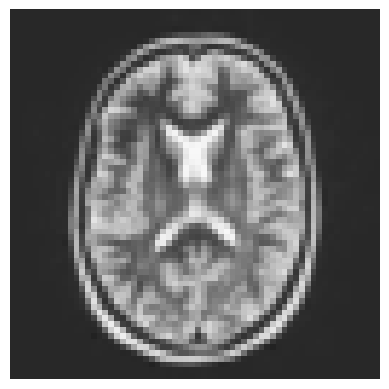

In [ ]:
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
import numpy as np
from image_enhancement import image_enhancement
import cv2 as cv

def load_bbhe_one_image(impath, newsize=64):
    # Load the image using OpenCV
    input_image = cv.imread(impath)

    # Initialize the IE object with the input image and 'HSV' color space
    ie = image_enhancement.IE(input_image, 'HSV')

    # Apply BBHE using the BBHE method
    output_image = ie.BBHE()

    # Convert the output image to a NumPy array
    im_array = np.array(output_image)

    # Resize the image
    im_array = resize(im_array, (newsize, newsize))

    return im_array

# Example usage
one = load_bbhe_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_bbhe_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")
print(one.shape)
print(two.shape)

import matplotlib.pyplot as plt
plt.imshow(one, cmap='gray') # Displaying in grayscale
plt.axis('off') # Hide axis
plt.show()

plt.imshow(two, cmap='gray') # Displaying in grayscale
plt.axis('off') # Hide axis
plt.show()


In [ ]:
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_bbhe_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_bbhe_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision = metrics.precision_score(y_test, predicted, average='weighted')
    recall = metrics.recall_score(y_test, predicted, average='weighted')
    f1 = metrics.f1_score(y_test, predicted, average='weighted')
    precision_array.append(precision)
    recall_array.append(recall)
    f1_array.append(f1)


# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.80      0.74      0.77        97
  meningioma       0.71      0.70      0.70        89
    no_tumor       0.95      0.88      0.91        89
   pituitary       0.83      0.99      0.90        85

    accuracy                           0.82       360
   macro avg       0.82      0.83      0.82       360
weighted avg       0.82      0.82      0.82       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.77      0.80      0.79        96
  meningioma       0.72      0.70      0.71        80
    no_tumor       0.99      0.87      0.93        87
   pituitary       0.89      0.96      0.92        97

    accuracy                           0.84       360
   macro avg       0.84      0.83      0.84       360
weighted avg       0.84      0.84      0.84       360

Iteration 3 Classification Report:
              precision  

## RMSHE (same package as bbhe)

(64, 64, 3)
(64, 64, 3)


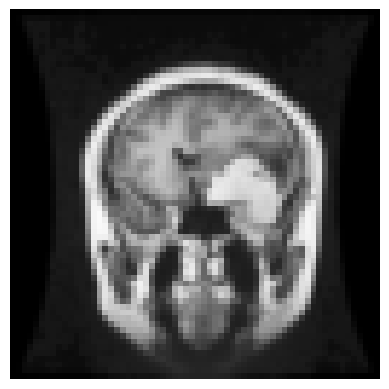

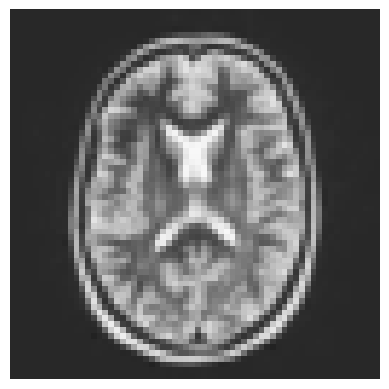

In [ ]:
from skimage.io import imread
from skimage.transform import resize
from skimage.color import rgb2gray
import numpy as np
from image_enhancement import image_enhancement
import cv2 as cv

def load_rmshe_one_image(impath, newsize=64):
    # Load the image using OpenCV
    input_image = cv.imread(impath)

    # Initialize the IE object with the input image and 'HSV' color space
    ie = image_enhancement.IE(input_image, 'HSV')

    # Apply RMSHE using the RMSHE method with recursive parameter
    output_image = ie.RMSHE(recursive=True)

    # Convert the output image to a NumPy array
    im_array = np.array(output_image)

    # Resize the image
    im_array = resize(im_array, (newsize, newsize))

    return im_array

# Example usage
one = load_rmshe_one_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
two = load_rmshe_one_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")
print(one.shape)
print(two.shape)

import matplotlib.pyplot as plt
plt.imshow(one, cmap='gray') # Displaying in grayscale
plt.axis('off') # Hide axis
plt.show()

plt.imshow(two, cmap='gray') # Displaying in grayscale
plt.axis('off') # Hide axis
plt.show()


In [ ]:
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_rmshe_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_rmshe_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision = metrics.precision_score(y_test, predicted, average='weighted')
    recall = metrics.recall_score(y_test, predicted, average='weighted')
    f1 = metrics.f1_score(y_test, predicted, average='weighted')
    precision_array.append(precision)
    recall_array.append(recall)
    f1_array.append(f1)


# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.80      0.74      0.77        97
  meningioma       0.71      0.70      0.70        89
    no_tumor       0.95      0.88      0.91        89
   pituitary       0.83      0.99      0.90        85

    accuracy                           0.82       360
   macro avg       0.82      0.83      0.82       360
weighted avg       0.82      0.82      0.82       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.77      0.80      0.79        96
  meningioma       0.72      0.70      0.71        80
    no_tumor       0.99      0.87      0.93        87
   pituitary       0.89      0.96      0.92        97

    accuracy                           0.84       360
   macro avg       0.84      0.83      0.84       360
weighted avg       0.84      0.84      0.84       360

Iteration 3 Classification Report:
              precision  

##Gamma Correction at gamma=0.9
https://pyimagesearch.com/2015/10/05/opencv-gamma-correction/

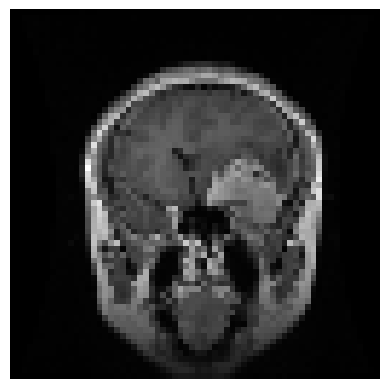

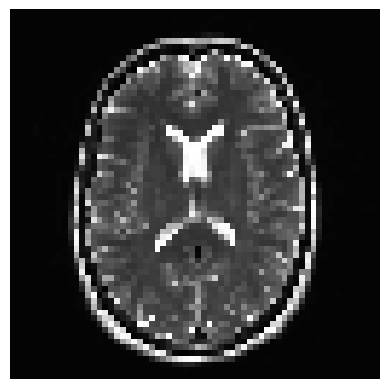

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def load_gamma_image(impath, newsize=64, gamma=0.9):
    # Load the image
    im = cv2.imread(impath, cv2.IMREAD_GRAYSCALE)

    # Resize the image
    im_resized = cv2.resize(im, (newsize, newsize))

    # Apply Gamma Correction
    # Build a lookup table for gamma correction
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(0, 256)]).astype("uint8")

    # Apply gamma correction using the lookup table
    im_gamma_corrected = cv2.LUT(im_resized, table)

    return im_gamma_corrected

# Example usage
gamma_corrected_one = load_gamma_image("/content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-meTr_0009.jpg")
gamma_corrected_two = load_gamma_image("/content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-noTr_0005.jpg")


plt.imshow(gamma_corrected_one, cmap='gray') # Displaying in grayscale
plt.axis('off') # Hide axis
plt.show()

plt.imshow(gamma_corrected_two, cmap='gray') # Displaying in grayscale
plt.axis('off') # Hide axis
plt.show()


In [ ]:
from sklearn import metrics, svm
from sklearn.model_selection import train_test_split
import numpy as np

# Initialize arrays to store metrics for each iteration
precision_array = []
recall_array = []
f1_array = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_gamma_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_gamma_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Print classification report for each iteration
    print(f"Iteration {i + 1} Classification Report:")
    print(metrics.classification_report(y_test, predicted, zero_division=1))

    # Calculate and store metrics
    precision = metrics.precision_score(y_test, predicted, average='weighted')
    recall = metrics.recall_score(y_test, predicted, average='weighted')
    f1 = metrics.f1_score(y_test, predicted, average='weighted')
    precision_array.append(precision)
    recall_array.append(recall)
    f1_array.append(f1)


# Calculate and print average metrics
avg_precision = np.mean(precision_array)
avg_recall = np.mean(recall_array)
avg_f1 = np.mean(f1_array)

print("\nAverage Metrics:")
print(f"Average Precision: {avg_precision:.3f}")
print(f"Average Recall: {avg_recall:.3f}")
print(f"Average F1-Score: {avg_f1:.3f}")


Iteration 1 Classification Report:
              precision    recall  f1-score   support

      glioma       0.81      0.73      0.77        97
  meningioma       0.71      0.73      0.72        89
    no_tumor       0.91      0.80      0.85        89
   pituitary       0.81      0.98      0.89        85

    accuracy                           0.81       360
   macro avg       0.81      0.81      0.81       360
weighted avg       0.81      0.81      0.80       360

Iteration 2 Classification Report:
              precision    recall  f1-score   support

      glioma       0.81      0.80      0.81        96
  meningioma       0.74      0.71      0.73        80
    no_tumor       0.95      0.91      0.93        87
   pituitary       0.87      0.94      0.90        97

    accuracy                           0.84       360
   macro avg       0.84      0.84      0.84       360
weighted avg       0.84      0.84      0.84       360

Iteration 3 Classification Report:
              precision  

##results



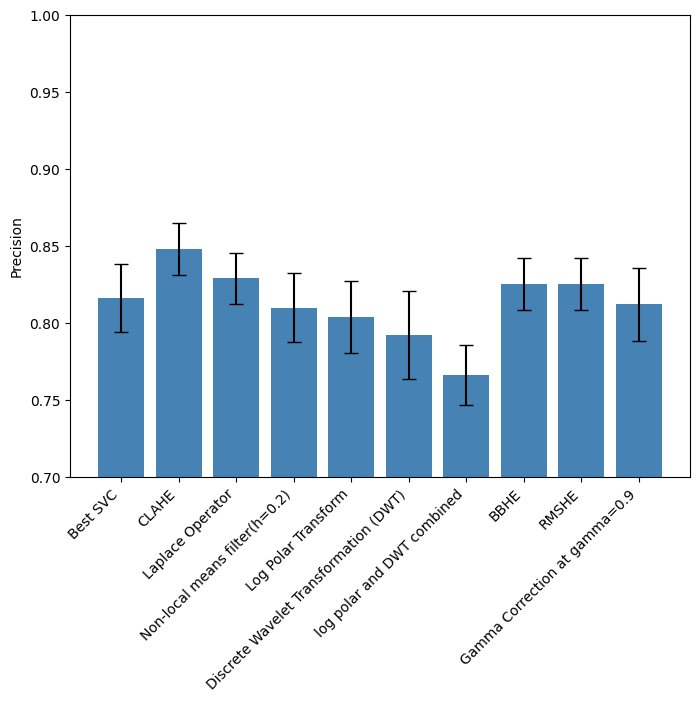

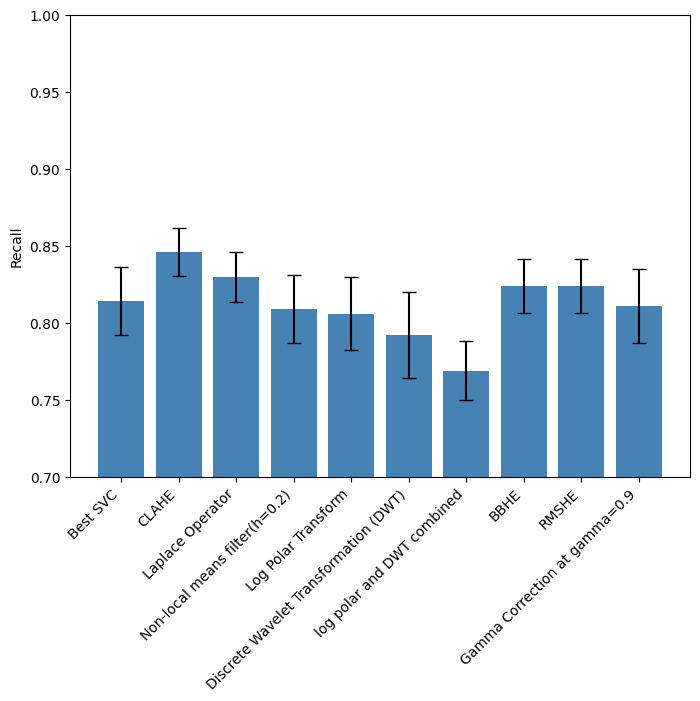

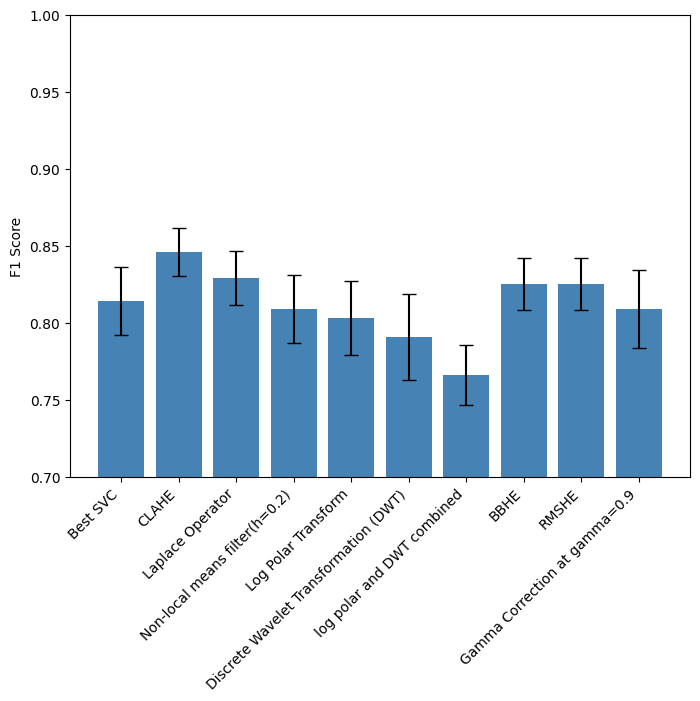

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Accuracy, Recall, and F1-Score values for each method
method_values = {
    "Best SVC": {"precision": [0.83, 0.83, 0.86, 0.79, 0.78, 0.81, 0.81, 0.80, 0.82, 0.83],
        "recall": [0.82, 0.83, 0.86, 0.79, 0.78, 0.81, 0.80, 0.80, 0.82, 0.83],
        "f1_score": [0.82, 0.83, 0.86, 0.79, 0.78, 0.81, 0.80, 0.80, 0.82, 0.83]},

    "CLAHE": {"precision": [0.83, 0.86, 0.87, 0.82, 0.83, 0.85, 0.84, 0.85, 0.86, 0.87],
        	         	    "recall": [0.83, 0.85, 0.87, 0.82, 0.83, 0.85, 0.84, 0.85, 0.85, 0.87],
       	           "f1_score": [0.83, 0.85, 0.87, 0.82, 0.83, 0.85, 0.84, 0.85, 0.85, 0.87]},

    "Laplace Operator": {"precision": [0.83, 0.85, 0.85, 0.82, 0.80, 0.82, 0.83, 0.81, 0.85, 0.83],
                                           "recall": [0.83, 0.85, 0.85, 0.81, 0.81, 0.82, 0.83, 0.81, 0.85, 0.84],
                                      "f1_score": [0.83, 0.85, 0.85, 0.80, 0.81, 0.82, 0.83, 0.81, 0.85, 0.84]},

    "Non-local means filter(h=0.2)": {"precision": [0.82, 0.83, 0.86, 0.79, 0.78, 0.79, 0.80, 0.80, 0.82, 0.81],
        "recall": [0.81, 0.83, 0.86, 0.79, 0.78, 0.79, 0.80, 0.80, 0.81, 0.82],
        "f1_score": [0.81, 0.83, 0.86, 0.79, 0.78, 0.79, 0.80, 0.80, 0.82, 0.81]},

    "Log Polar Transform": {"precision": [0.81, 0.82, 0.85, 0.79, 0.77, 0.77, 0.79, 0.81, 0.81, 0.82],
                                                "recall": [0.80, 0.83, 0.85, 0.79, 0.77, 0.78, 0.79, 0.81, 0.81, 0.83],
                                          "f1_score": [0.80, 0.83, 0.85, 0.79, 0.77, 0.77, 0.79, 0.80, 0.81, 0.82]},


    "Discrete Wavelet Transformation (DWT)": {"precision": [0.76, 0.79, 0.86, 0.80, 0.76, 0.81, 0.77, 0.78, 0.81, 0.78],
        "recall": [0.76, 0.79, 0.86, 0.80, 0.76, 0.80, 0.77, 0.78, 0.81, 0.79],
        "f1_score": [0.76, 0.79, 0.86, 0.80, 0.76, 0.80, 0.77, 0.78, 0.81, 0.78]},

    "log polar and DWT combined": {"precision": [0.74, 0.78, 0.81, 0.77, 0.76, 0.77, 0.77, 0.74, 0.77, 0.75],
        "recall": [0.74, 0.78, 0.81, 0.77, 0.77, 0.77, 0.77, 0.74, 0.78, 0.76],
        "f1_score": [0.74, 0.78, 0.81, 0.77, 0.76, 0.77, 0.77, 0.74, 0.77, 0.75]},

    "BBHE": {"precision": [0.82, 0.84, 0.84, 0.83, 0.78, 0.84, 0.82, 0.83, 0.82, 0.83],
        "recall": [0.82, 0.84, 0.84, 0.83, 0.78, 0.84, 0.81, 0.83, 0.82, 0.83],
        "f1_score": [0.82, 0.84, 0.84, 0.83, 0.78, 0.84, 0.82, 0.83, 0.82, 0.83]},

    "RMSHE": {"precision": [0.82, 0.84, 0.84, 0.83, 0.78, 0.84, 0.82, 0.83, 0.82, 0.83],
        "recall": [0.82, 0.84, 0.84, 0.83, 0.78, 0.84, 0.81, 0.83, 0.82, 0.83],
        "f1_score": [0.82, 0.84, 0.84, 0.83, 0.78, 0.84, 0.82, 0.83, 0.82, 0.83]},

    "Gamma Correction at gamma=0.9": {"precision": [0.81, 0.84, 0.86, 0.80, 0.78, 0.81, 0.79, 0.79, 0.83, 0.81],
        "recall": [0.81, 0.84, 0.86, 0.79, 0.78, 0.81, 0.79, 0.79, 0.83, 0.81],
        "f1_score": [0.80, 0.84, 0.86, 0.79, 0.78, 0.81, 0.79, 0.78, 0.83, 0.81]},

}

# Plotting Average Precision
plt.figure(figsize=(8, 6))
plt.bar(method_values.keys(), [np.mean(method_values[method]["precision"]) for method in method_values],
        yerr=[np.std(method_values[method]["precision"]) for method in method_values], capsize=5, color='steelblue')
plt.ylim(0.70, 1)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Precision')
plt.show()

# Plotting Average Recall
plt.figure(figsize=(8, 6))
plt.bar(method_values.keys(), [np.mean(method_values[method]["recall"]) for method in method_values],
        yerr=[np.std(method_values[method]["recall"]) for method in method_values], capsize=5, color='steelblue')

plt.ylim(0.70, 1)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Recall')
plt.show()

# Plotting Average F1 Score
plt.figure(figsize=(8, 6))
plt.bar(method_values.keys(), [np.mean(method_values[method]["f1_score"]) for method in method_values],
        yerr=[np.std(method_values[method]["f1_score"]) for method in method_values], capsize=5, color='steelblue')
plt.ylim(0.70, 1)
plt.xticks(rotation=45, ha='right')
plt.ylabel('F1 Score')
plt.show()



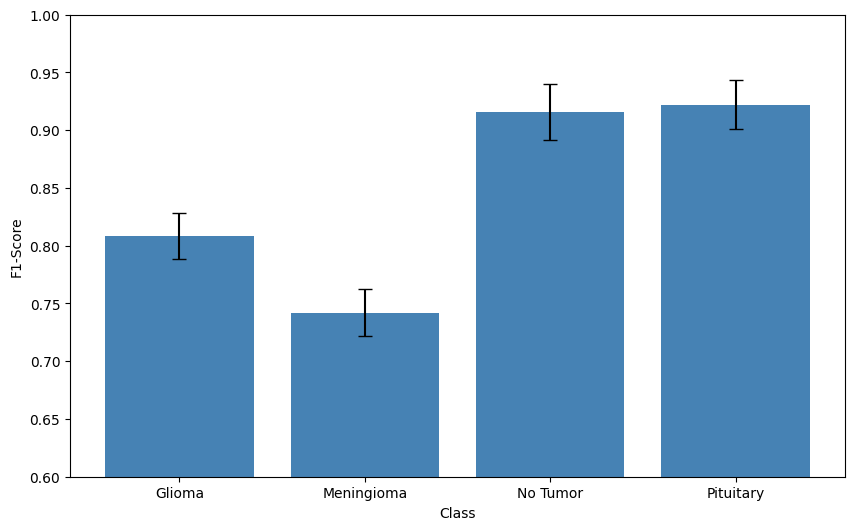

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# F1-scores for each class across iterations
f1_scores = {
    'Glioma': [0.80, 0.82, 0.82, 0.78, 0.81, 0.84, 0.77, 0.82, 0.80, 0.82],
    'Meningioma': [0.73, 0.72, 0.78, 0.72, 0.72, 0.76, 0.73, 0.76, 0.76, 0.74],
    'No Tumor': [0.87, 0.94, 0.93, 0.89, 0.90, 0.90, 0.92, 0.94, 0.92, 0.95],
    'Pituitary': [0.92, 0.92, 0.93, 0.90, 0.91, 0.90, 0.92, 0.90, 0.96, 0.96]
}

# Calculate mean and standard deviation for each class
class_mean_f1 = {cls: np.mean(scores) for cls, scores in f1_scores.items()}
class_std_f1 = {cls: np.std(scores) for cls, scores in f1_scores.items()}

# Plotting
plt.figure(figsize=(10, 6))

classes = list(class_mean_f1.keys())
mean_f1 = list(class_mean_f1.values())
std_dev = list(class_std_f1.values())

plt.bar(classes, mean_f1, yerr=std_dev, capsize=5, color='steelblue')
plt.xlabel('Class')
plt.ylabel('F1-Score')
plt.ylim(0.6, 1.0)  # Set the y-axis limit for better visualization

plt.show()


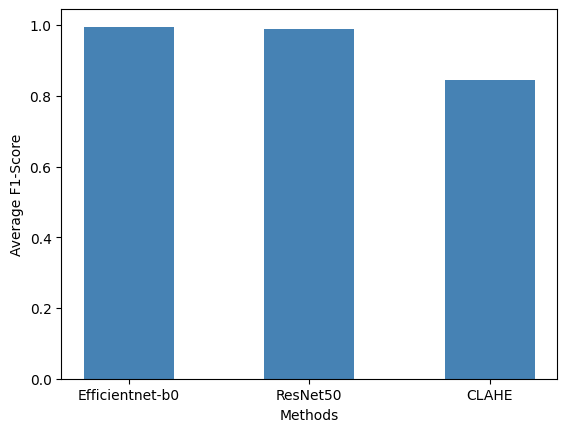

In [ ]:
import matplotlib.pyplot as plt

# Data
methods = ['Efficientnet-b0', 'ResNet50', 'CLAHE']
scores = [0.9953, 0.99, 0.846]

# Plotting
plt.bar(methods, scores, color='steelblue', width=0.5)  # Adjust width here

# Adding labels and title
plt.xlabel('Methods')
plt.ylabel('Average F1-Score')

# Display the plot
plt.show()


## determining pattern with misclassified images with CLAHE (best model found)

from 10 models tested occuring in for count 8 and 7  datasets no images were found

In [23]:
from sklearn.model_selection import train_test_split
from sklearn import svm
import numpy as np
from collections import Counter

# Initialize list to store misclassified indices across iterations
all_misclassified_indices = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_CLAHE_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_CLAHE_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Track misclassified indices
    misclassified_indices = [idx for idx, (true, pred) in enumerate(zip(y_test, predicted)) if true != pred]
    all_misclassified_indices.extend(misclassified_indices)

# Count occurrences of each misclassified image index
misclassified_counts = Counter(all_misclassified_indices)

# Determine consistently misclassified image indices
consistent_misclassified_indices = [idx for idx, count in misclassified_counts.items() if count >= 6]

print("Consistently Misclassified Image Indices:")
print(consistent_misclassified_indices)


Consistently Misclassified Image Indices:
[230]


Consistently Misclassified Image at Index 230: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1253.jpg


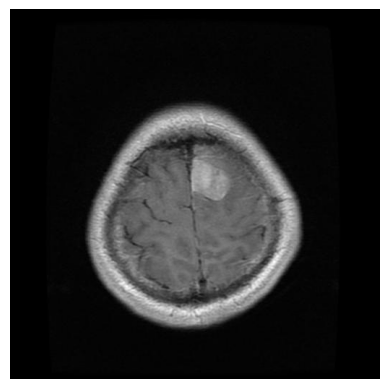

In [24]:
import cv2
import matplotlib.pyplot as plt

def load_and_display_image(image_path):
    # Load image using OpenCV (cv2)
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale

    if img is not None:
        # Display image using matplotlib
        plt.imshow(img, cmap='gray')  # Displaying in grayscale
        plt.axis('off')  # Turn off axis labels
        plt.show()
    else:
        print(f"Failed to load image: {image_path}")

# Assuming X_test contains paths to test image files
# Replace 'X_test' with your actual dataset containing test image paths

# Load and display consistently misclassified images
for idx in consistent_misclassified_indices:
    if idx < len(X_test):  # Ensure index is within bounds of X_test
        image_path = X_test[idx]
        print(f"Consistently Misclassified Image at Index {idx}: {image_path}")
        load_and_display_image(image_path)
    else:
        print(f"Index {idx} is out of bounds of the dataset")


In [13]:
from sklearn.model_selection import train_test_split
from sklearn import svm
import numpy as np
from collections import Counter

# Initialize list to store misclassified indices across iterations
all_misclassified_indices = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_CLAHE_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_CLAHE_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Track misclassified indices
    misclassified_indices = [idx for idx, (true, pred) in enumerate(zip(y_test, predicted)) if true != pred]
    all_misclassified_indices.extend(misclassified_indices)

# Count occurrences of each misclassified image index
misclassified_counts = Counter(all_misclassified_indices)

# Determine consistently misclassified image indices
consistent_misclassified_indices = [idx for idx, count in misclassified_counts.items() if count >= 5]

print("Consistently Misclassified Image Indices:")
print(consistent_misclassified_indices)


Consistently Misclassified Image Indices:
[212, 294, 230, 302]


Consistently Misclassified Image at Index 212: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0760.jpg


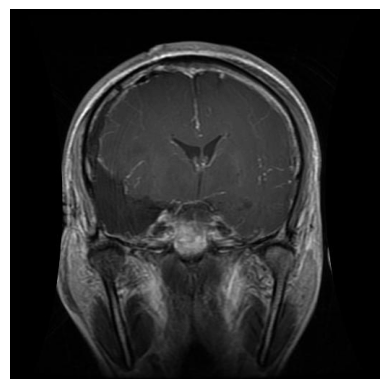

Consistently Misclassified Image at Index 294: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0730.jpg


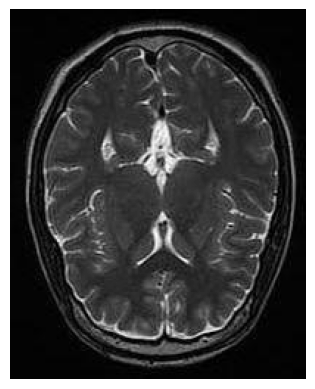

Consistently Misclassified Image at Index 230: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1253.jpg


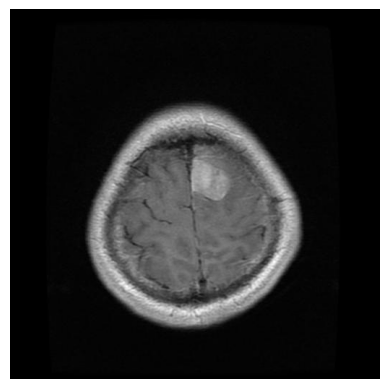

Consistently Misclassified Image at Index 302: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1126.jpg


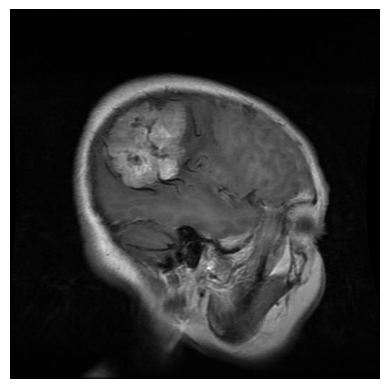

In [15]:
import cv2
import matplotlib.pyplot as plt

def load_and_display_image(image_path):
    # Load image using OpenCV (cv2)
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale

    if img is not None:
        # Display image using matplotlib
        plt.imshow(img, cmap='gray')  # Displaying in grayscale
        plt.axis('off')  # Turn off axis labels
        plt.show()
    else:
        print(f"Failed to load image: {image_path}")

# Assuming X_test contains paths to test image files
# Replace 'X_test' with your actual dataset containing test image paths

# Load and display consistently misclassified images
for idx in consistent_misclassified_indices:
    if idx < len(X_test):  # Ensure index is within bounds of X_test
        image_path = X_test[idx]
        print(f"Consistently Misclassified Image at Index {idx}: {image_path}")
        load_and_display_image(image_path)
    else:
        print(f"Index {idx} is out of bounds of the dataset")


In [17]:
from sklearn.model_selection import train_test_split
from sklearn import svm
import numpy as np
from collections import Counter

# Initialize list to store misclassified indices across iterations
all_misclassified_indices = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_CLAHE_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_CLAHE_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Track misclassified indices
    misclassified_indices = [idx for idx, (true, pred) in enumerate(zip(y_test, predicted)) if true != pred]
    all_misclassified_indices.extend(misclassified_indices)

# Count occurrences of each misclassified image index
misclassified_counts = Counter(all_misclassified_indices)

# Determine consistently misclassified image indices
consistent_misclassified_indices = [idx for idx, count in misclassified_counts.items() if count >= 4]

print("Consistently Misclassified Image Indices:")
print(consistent_misclassified_indices)


Consistently Misclassified Image Indices:
[52, 212, 294, 2, 32, 93, 101, 108, 230, 247, 314, 343, 106, 281, 302, 329]


Consistently Misclassified Image at Index 52: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1122.jpg


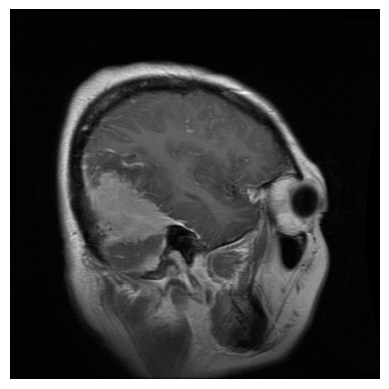

Consistently Misclassified Image at Index 212: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0760.jpg


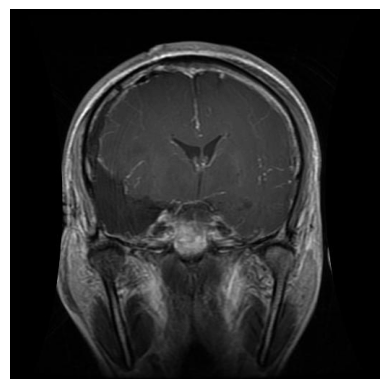

Consistently Misclassified Image at Index 294: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0730.jpg


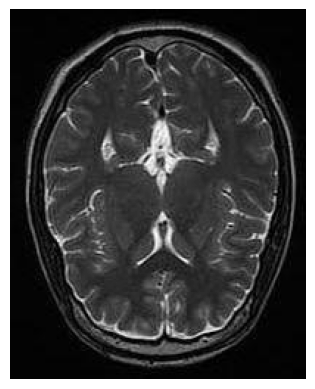

Consistently Misclassified Image at Index 2: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1484.jpg


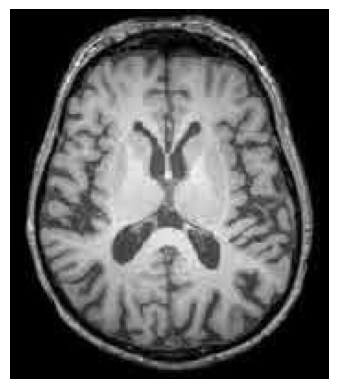

Consistently Misclassified Image at Index 32: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0261.jpg


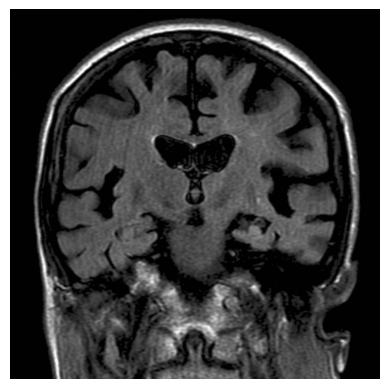

Consistently Misclassified Image at Index 93: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1090.jpg


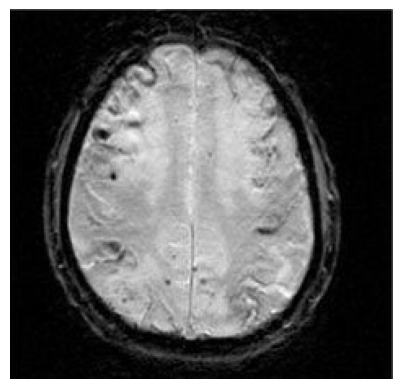

Consistently Misclassified Image at Index 101: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1335.jpg


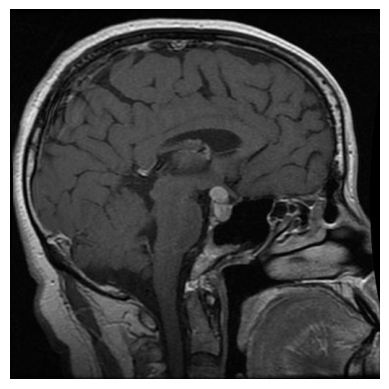

Consistently Misclassified Image at Index 108: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0634.jpg


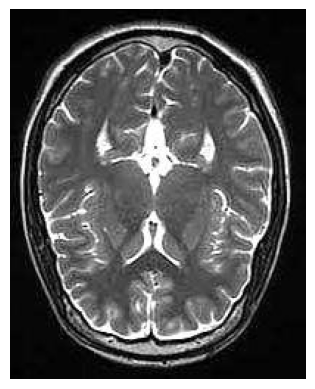

Consistently Misclassified Image at Index 230: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1253.jpg


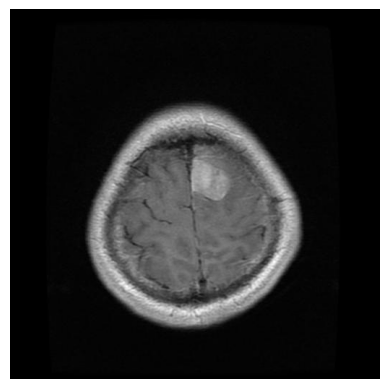

Consistently Misclassified Image at Index 247: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0092.jpg


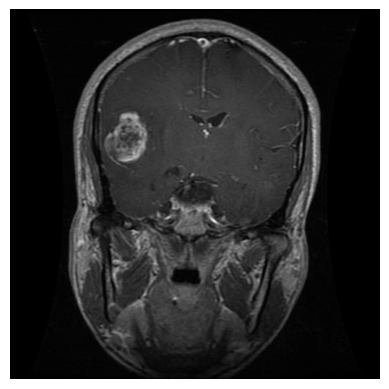

Consistently Misclassified Image at Index 314: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0263.jpg


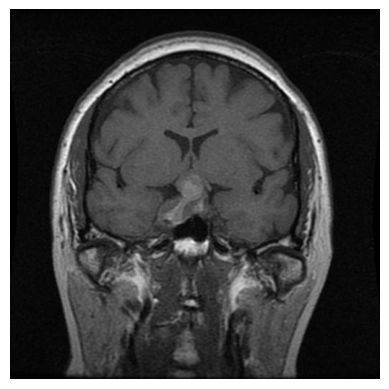

Consistently Misclassified Image at Index 343: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1267.jpg


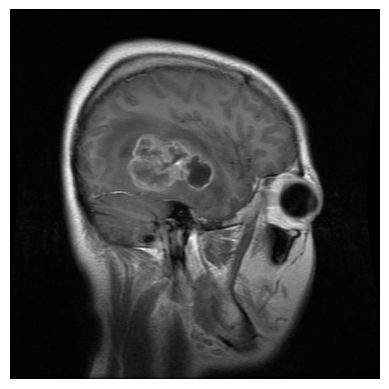

Consistently Misclassified Image at Index 106: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1148.jpg


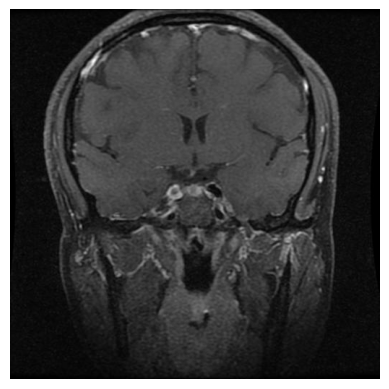

Consistently Misclassified Image at Index 281: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1177.jpg


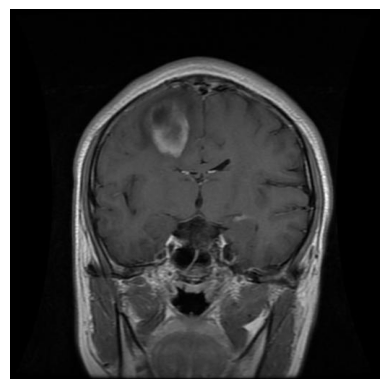

Consistently Misclassified Image at Index 302: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1126.jpg


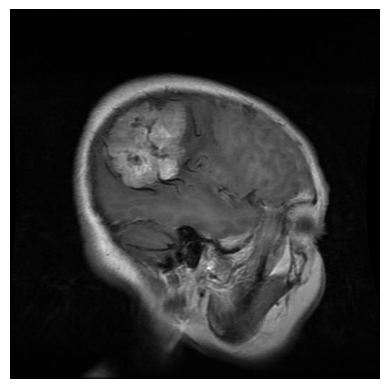

Consistently Misclassified Image at Index 329: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0092.jpg


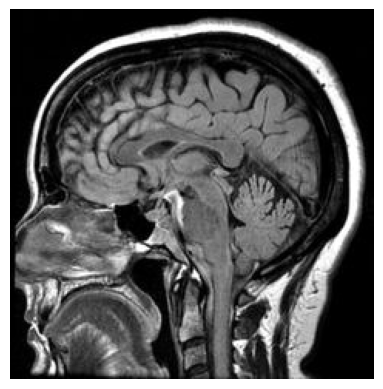

In [18]:
import cv2
import matplotlib.pyplot as plt

def load_and_display_image(image_path):
    # Load image using OpenCV (cv2)
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale

    if img is not None:
        # Display image using matplotlib
        plt.imshow(img, cmap='gray')  # Displaying in grayscale
        plt.axis('off')  # Turn off axis labels
        plt.show()
    else:
        print(f"Failed to load image: {image_path}")

# Assuming X_test contains paths to test image files
# Replace 'X_test' with your actual dataset containing test image paths

# Load and display consistently misclassified images
for idx in consistent_misclassified_indices:
    if idx < len(X_test):  # Ensure index is within bounds of X_test
        image_path = X_test[idx]
        print(f"Consistently Misclassified Image at Index {idx}: {image_path}")
        load_and_display_image(image_path)
    else:
        print(f"Index {idx} is out of bounds of the dataset")


In [20]:
from sklearn.model_selection import train_test_split
from sklearn import svm
import numpy as np
from collections import Counter

# Initialize list to store misclassified indices across iterations
all_misclassified_indices = []

for i in range(10):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=i)
    Xdata_train = [load_CLAHE_one_image(impath).flatten() for impath in X_train]
    Xdata_test = [load_CLAHE_one_image(impath).flatten() for impath in X_test]

    clf = svm.SVC(kernel='rbf', class_weight='balanced')
    clf.fit(Xdata_train, y_train)
    predicted = clf.predict(Xdata_test)

    # Track misclassified indices
    misclassified_indices = [idx for idx, (true, pred) in enumerate(zip(y_test, predicted)) if true != pred]
    all_misclassified_indices.extend(misclassified_indices)

# Count occurrences of each misclassified image index
misclassified_counts = Counter(all_misclassified_indices)

# Determine consistently misclassified image indices
consistent_misclassified_indices = [idx for idx, count in misclassified_counts.items() if count >= 3]

print("Consistently Misclassified Image Indices:")
print(consistent_misclassified_indices)


Consistently Misclassified Image Indices:
[0, 19, 41, 51, 52, 59, 65, 74, 86, 89, 92, 122, 139, 167, 178, 212, 214, 216, 273, 285, 290, 294, 300, 319, 2, 17, 32, 80, 93, 101, 108, 114, 144, 161, 170, 194, 202, 206, 224, 228, 230, 245, 247, 259, 271, 314, 343, 62, 76, 106, 190, 215, 274, 281, 302, 329, 119, 128, 182, 237, 238, 250, 270, 275, 289, 306, 335, 15, 20, 8, 113, 174, 186, 120, 46]


Consistently Misclassified Image at Index 0: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0385.jpg


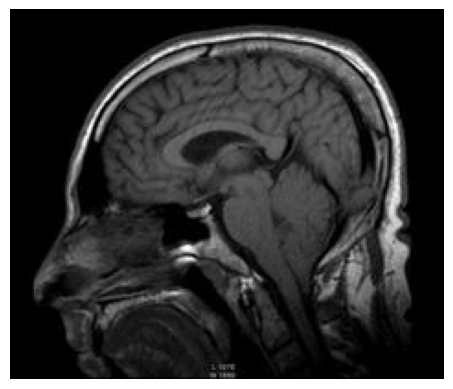

Consistently Misclassified Image at Index 19: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0216.jpg


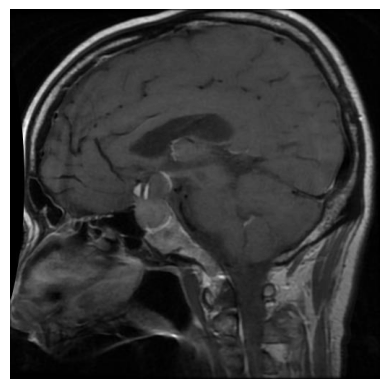

Consistently Misclassified Image at Index 41: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0816.jpg


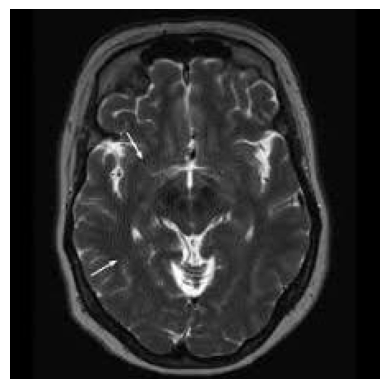

Consistently Misclassified Image at Index 51: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1140.jpg


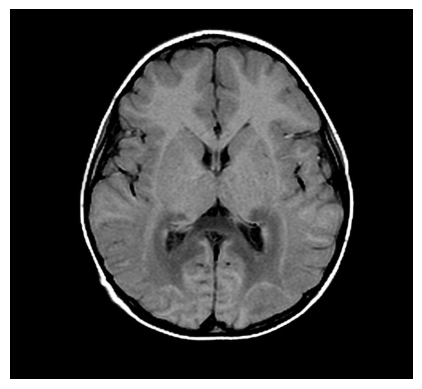

Consistently Misclassified Image at Index 52: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1122.jpg


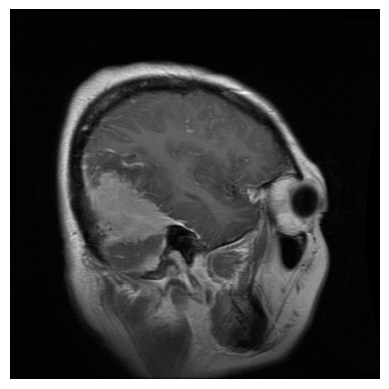

Consistently Misclassified Image at Index 59: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1592.jpg


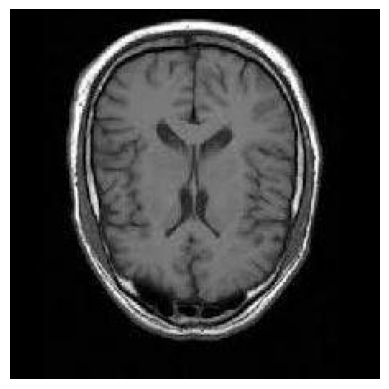

Consistently Misclassified Image at Index 65: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1046.jpg


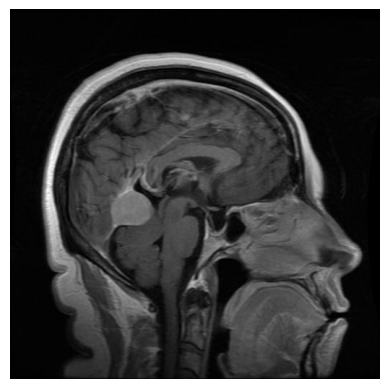

Consistently Misclassified Image at Index 74: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1055.jpg


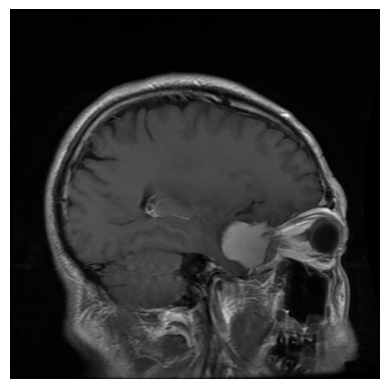

Consistently Misclassified Image at Index 86: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1170.jpg


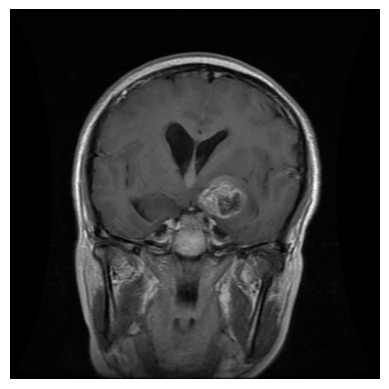

Consistently Misclassified Image at Index 89: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0858.jpg


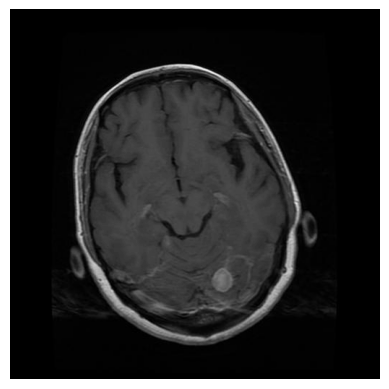

Consistently Misclassified Image at Index 92: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1284.jpg


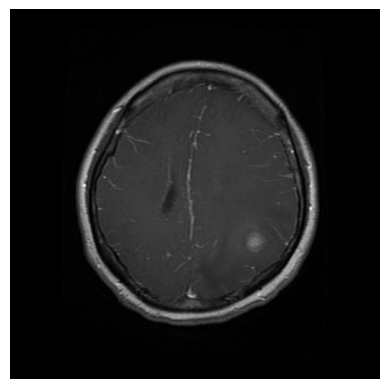

Consistently Misclassified Image at Index 122: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0649.jpg


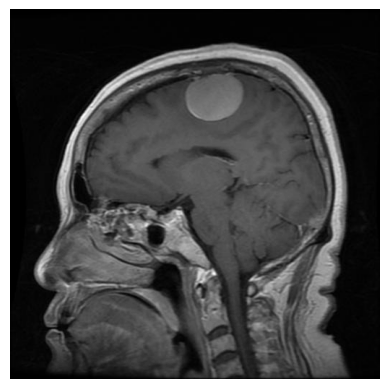

Consistently Misclassified Image at Index 139: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0666.jpg


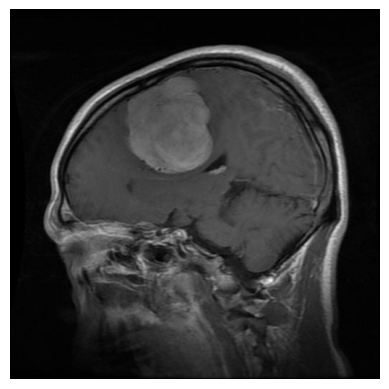

Consistently Misclassified Image at Index 167: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0046.jpg


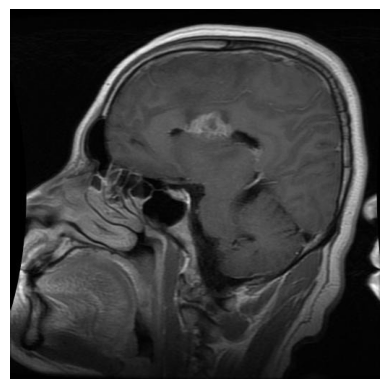

Consistently Misclassified Image at Index 178: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0260.jpg


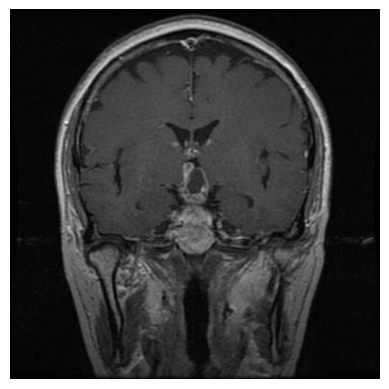

Consistently Misclassified Image at Index 212: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0760.jpg


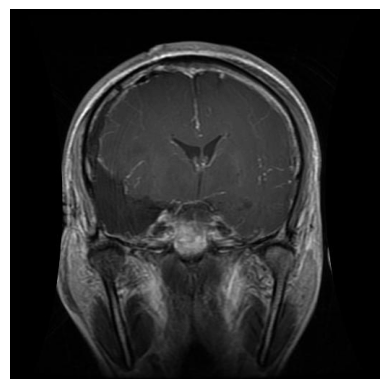

Consistently Misclassified Image at Index 214: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1221.jpg


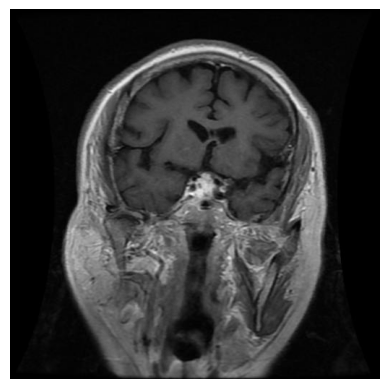

Consistently Misclassified Image at Index 216: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0662.jpg


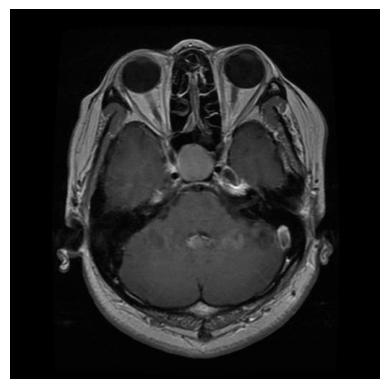

Consistently Misclassified Image at Index 273: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-glTr_0003.jpg


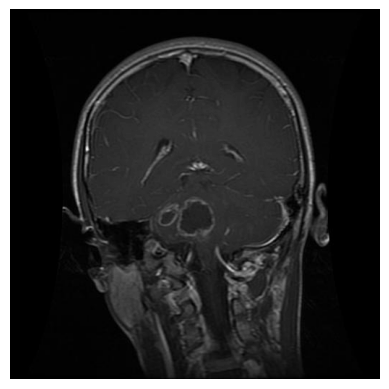

Consistently Misclassified Image at Index 285: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1567.jpg


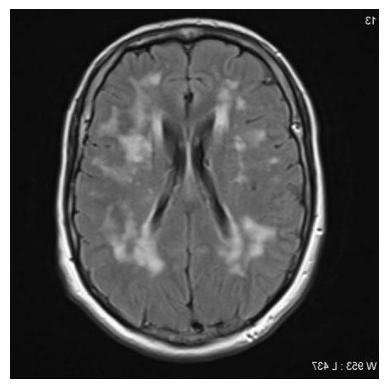

Consistently Misclassified Image at Index 290: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1575.jpg


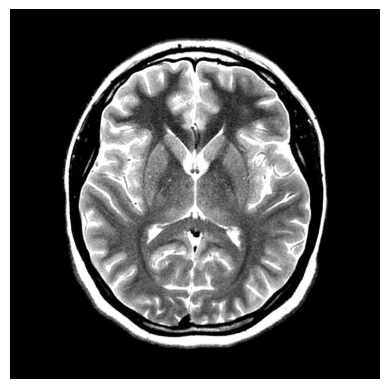

Consistently Misclassified Image at Index 294: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0730.jpg


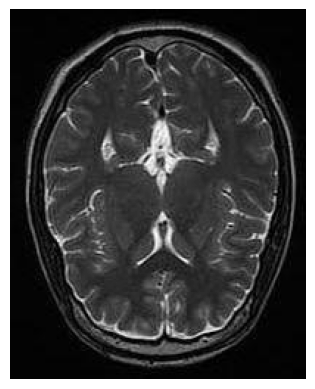

Consistently Misclassified Image at Index 300: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0397.jpg


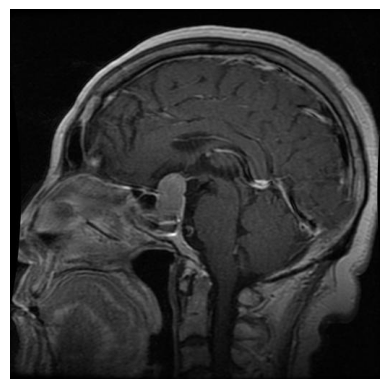

Consistently Misclassified Image at Index 319: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1144.jpg


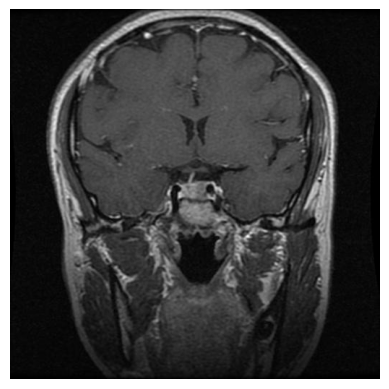

Consistently Misclassified Image at Index 2: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1484.jpg


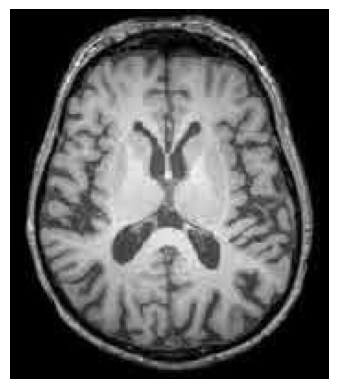

Consistently Misclassified Image at Index 17: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0161.jpg


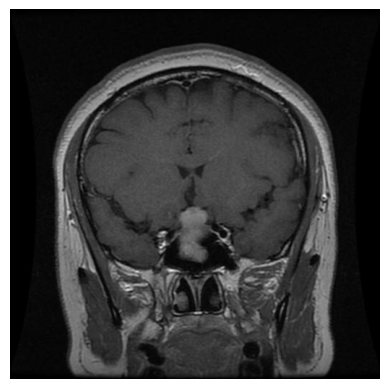

Consistently Misclassified Image at Index 32: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0261.jpg


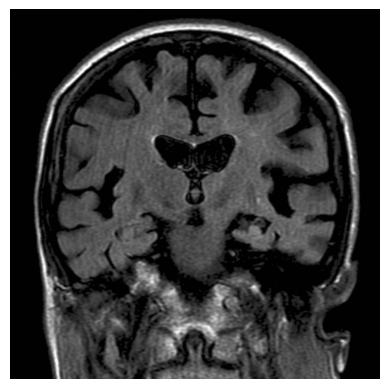

Consistently Misclassified Image at Index 80: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0457.jpg


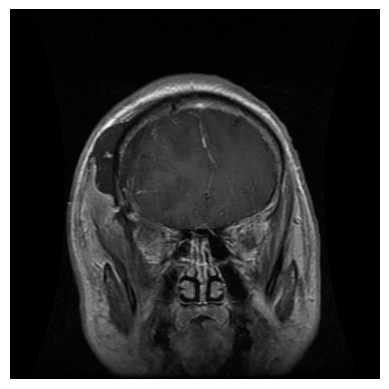

Consistently Misclassified Image at Index 93: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1090.jpg


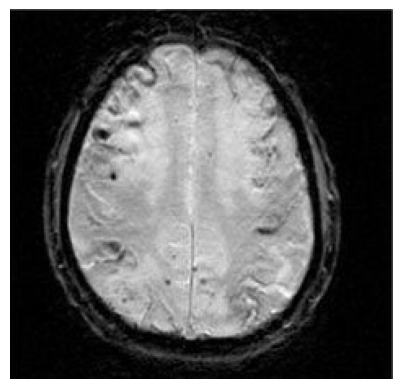

Consistently Misclassified Image at Index 101: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1335.jpg


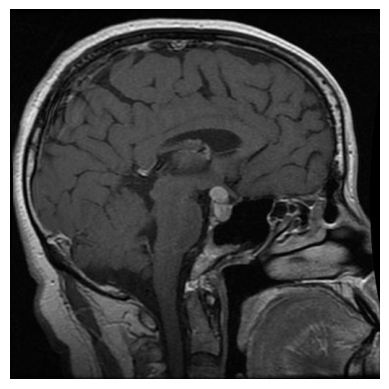

Consistently Misclassified Image at Index 108: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0634.jpg


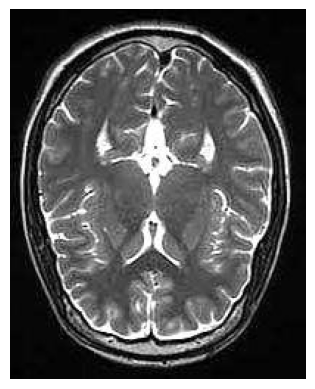

Consistently Misclassified Image at Index 114: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0083.jpg


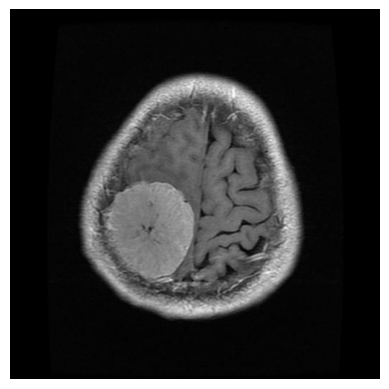

Consistently Misclassified Image at Index 144: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0027.jpg


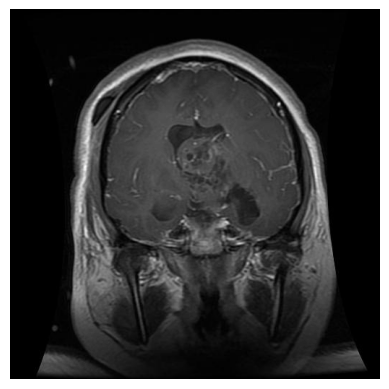

Consistently Misclassified Image at Index 161: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0509.jpg


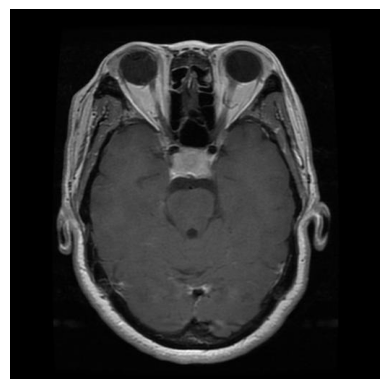

Consistently Misclassified Image at Index 170: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0772.jpg


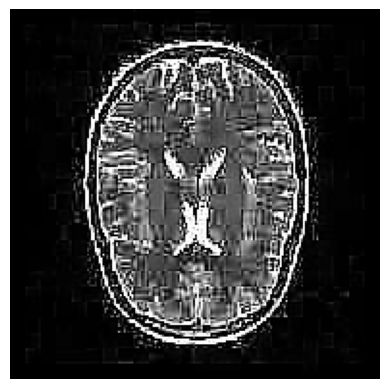

Consistently Misclassified Image at Index 194: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0145.jpg


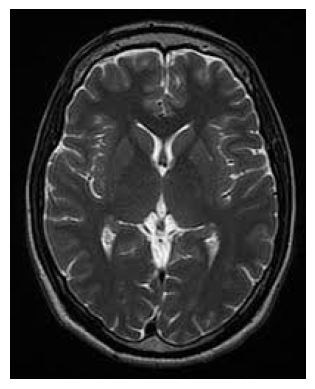

Consistently Misclassified Image at Index 202: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0479.jpg


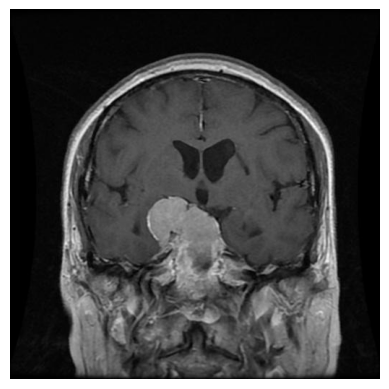

Consistently Misclassified Image at Index 206: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0785.jpg


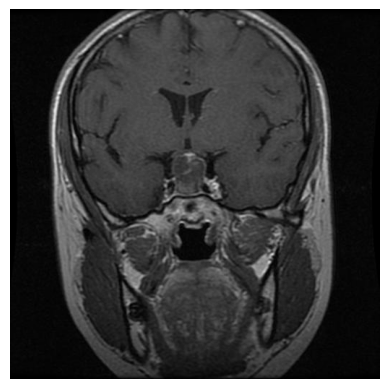

Consistently Misclassified Image at Index 224: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0443.jpg


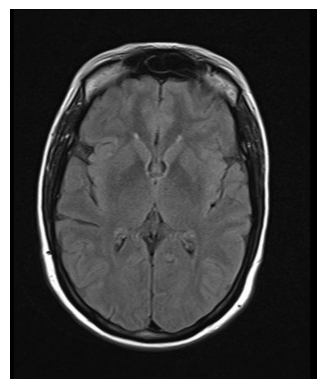

Consistently Misclassified Image at Index 228: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0891.jpg


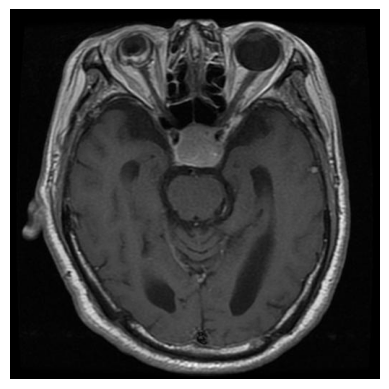

Consistently Misclassified Image at Index 230: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1253.jpg


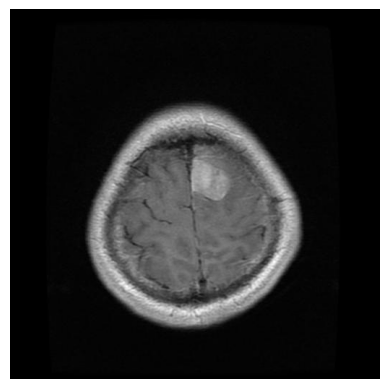

Consistently Misclassified Image at Index 245: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0160.jpg


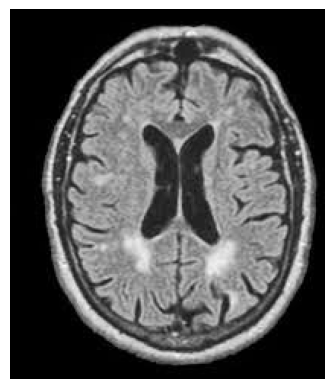

Consistently Misclassified Image at Index 247: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0092.jpg


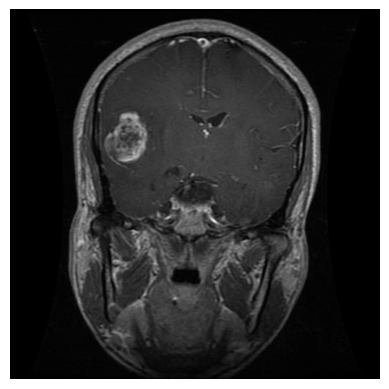

Consistently Misclassified Image at Index 259: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1162.jpg


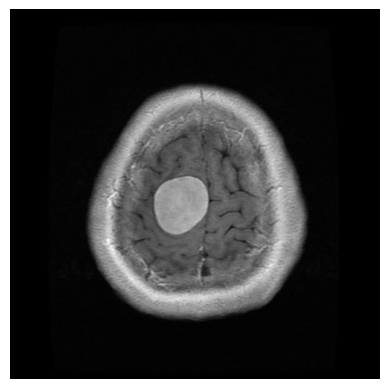

Consistently Misclassified Image at Index 271: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1503.jpg


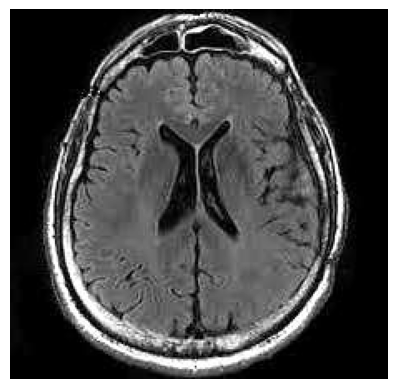

Consistently Misclassified Image at Index 314: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0263.jpg


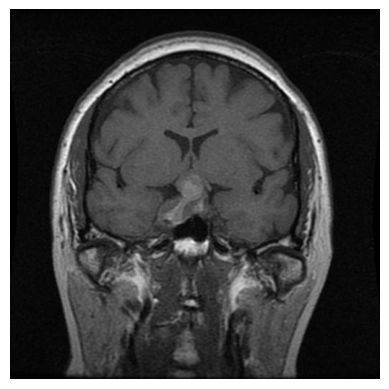

Consistently Misclassified Image at Index 343: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1267.jpg


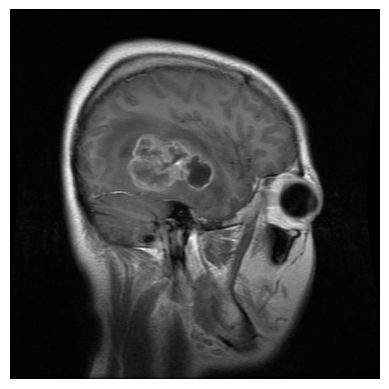

Consistently Misclassified Image at Index 62: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0444.jpg


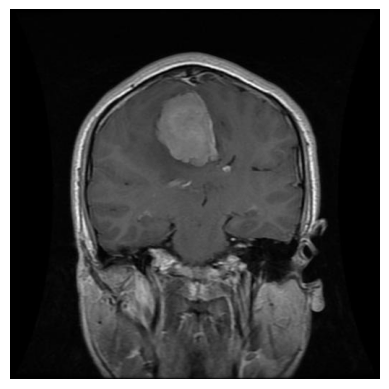

Consistently Misclassified Image at Index 76: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0983.jpg


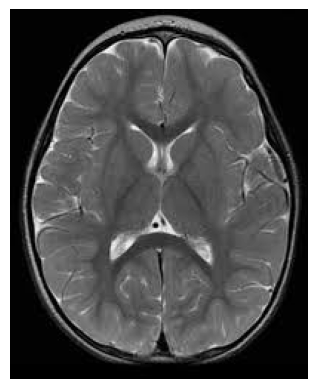

Consistently Misclassified Image at Index 106: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1148.jpg


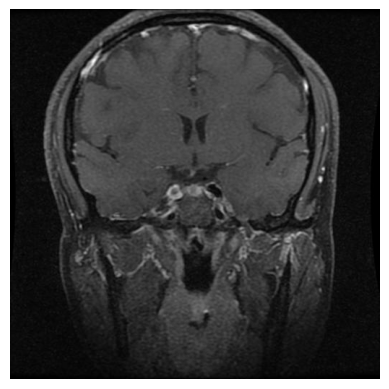

Consistently Misclassified Image at Index 190: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1367.jpg


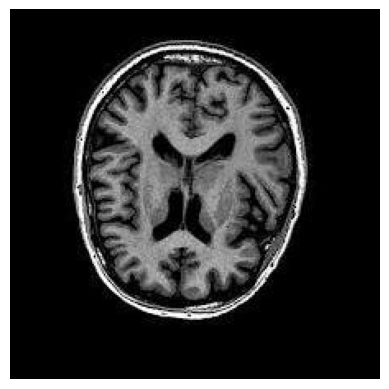

Consistently Misclassified Image at Index 215: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0225.jpg


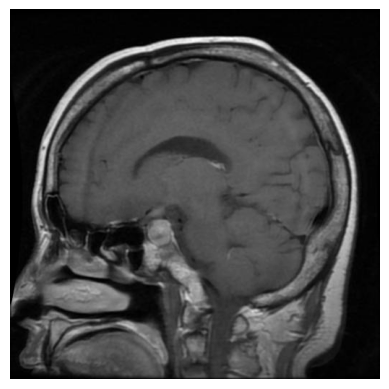

Consistently Misclassified Image at Index 274: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1113.jpg


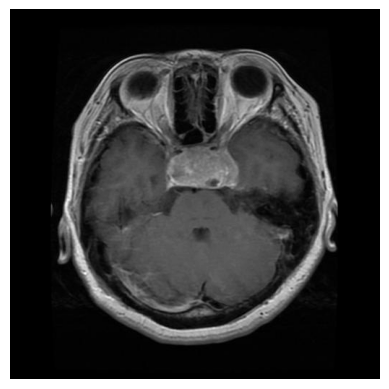

Consistently Misclassified Image at Index 281: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1177.jpg


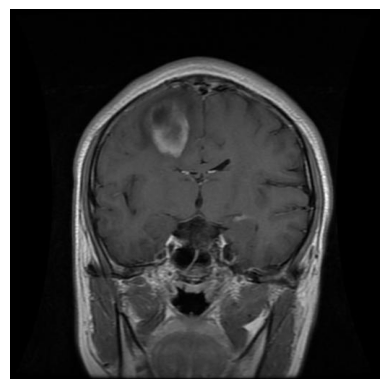

Consistently Misclassified Image at Index 302: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1126.jpg


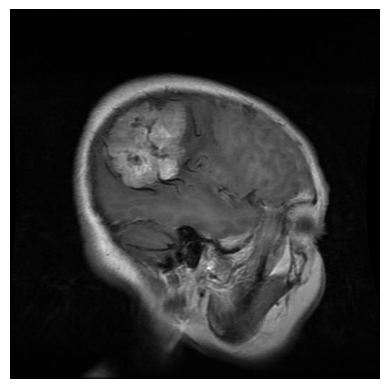

Consistently Misclassified Image at Index 329: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_0092.jpg


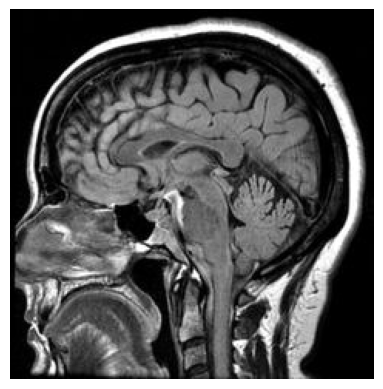

Consistently Misclassified Image at Index 119: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1201.jpg


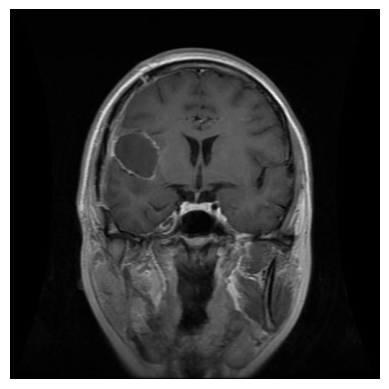

Consistently Misclassified Image at Index 128: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0182.jpg


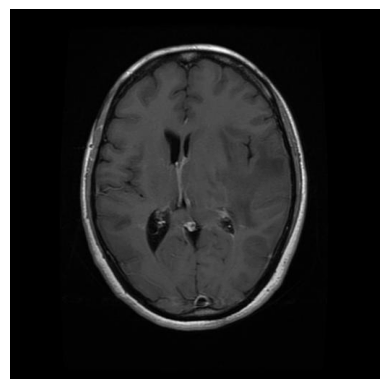

Consistently Misclassified Image at Index 182: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0677.jpg


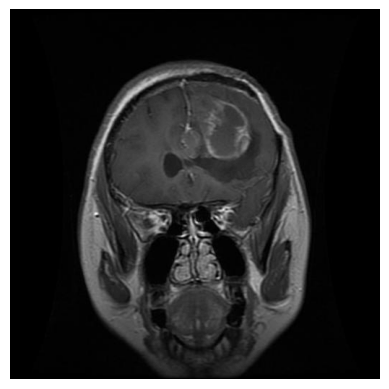

Consistently Misclassified Image at Index 237: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1176.jpg


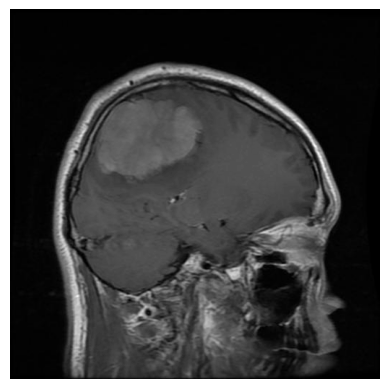

Consistently Misclassified Image at Index 238: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_0473.jpg


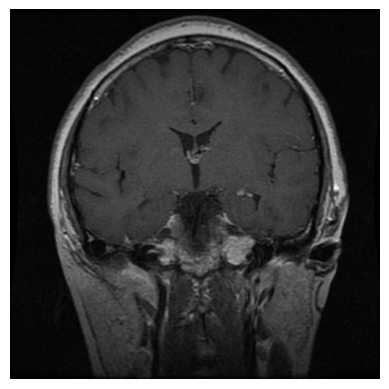

Consistently Misclassified Image at Index 250: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1274.jpg


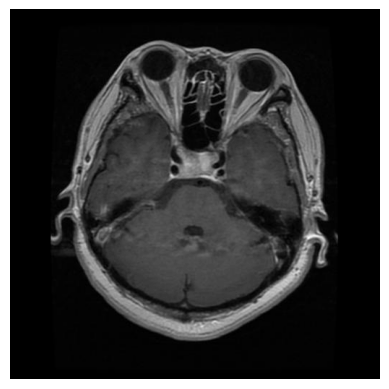

Consistently Misclassified Image at Index 270: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-pi_1414.jpg


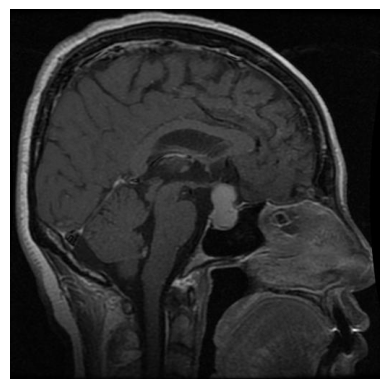

Consistently Misclassified Image at Index 275: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0933.jpg


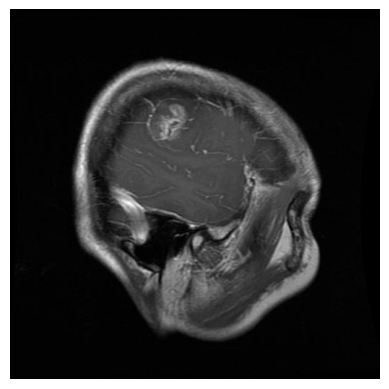

Consistently Misclassified Image at Index 289: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1154.jpg


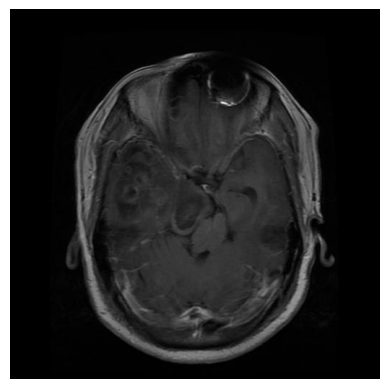

Consistently Misclassified Image at Index 306: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0236.jpg


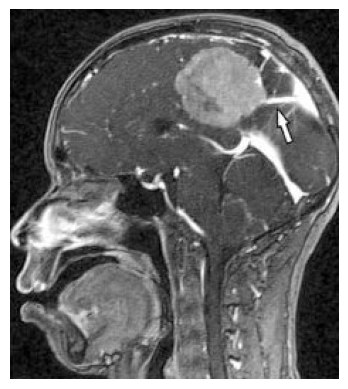

Consistently Misclassified Image at Index 335: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0579.jpg


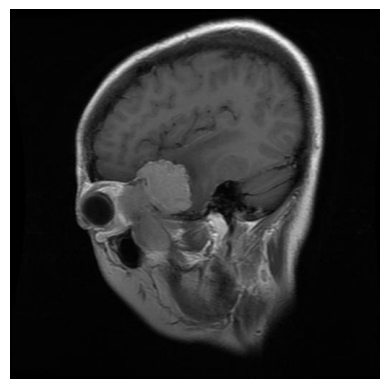

Consistently Misclassified Image at Index 15: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0804.jpg


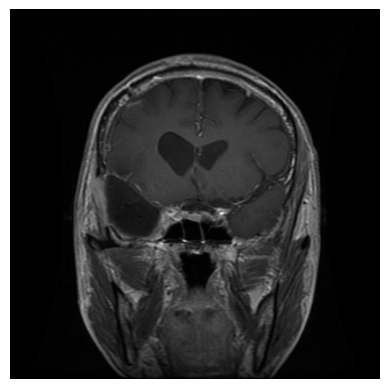

Consistently Misclassified Image at Index 20: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_0121.jpg


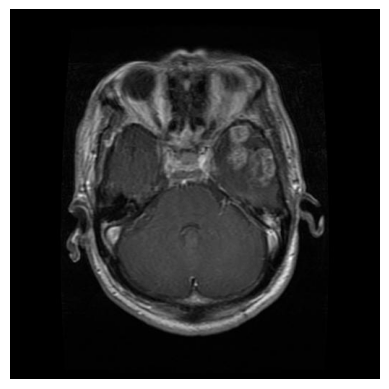

Consistently Misclassified Image at Index 8: /content/drive/MyDrive/thesis/final_data/no_tumor_grey/Tr-no_1110.jpg


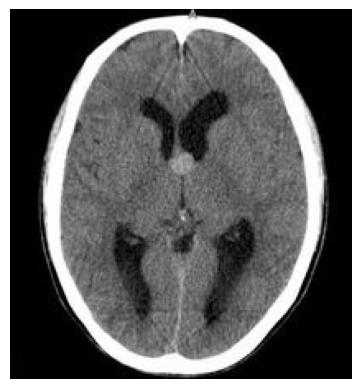

Consistently Misclassified Image at Index 113: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0559.jpg


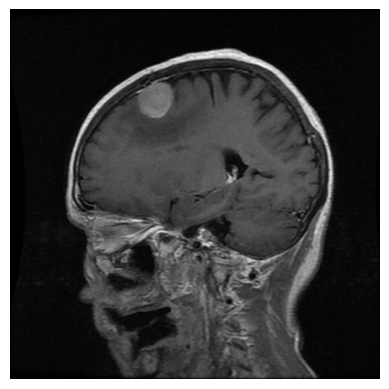

Consistently Misclassified Image at Index 174: /content/drive/MyDrive/thesis/final_data/pituitary_grey/Tr-piTr_0005.jpg


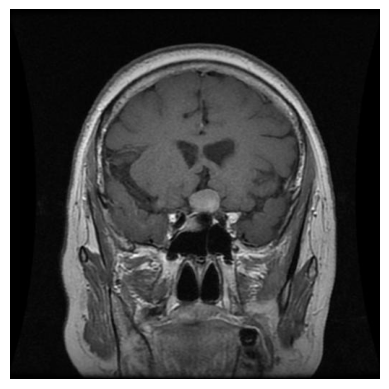

Consistently Misclassified Image at Index 186: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_0945.jpg


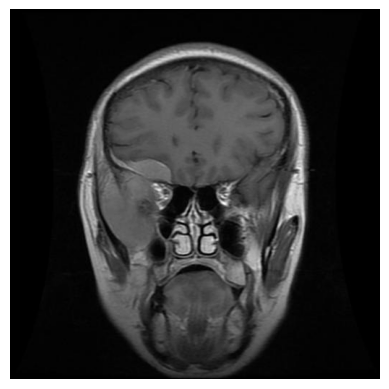

Consistently Misclassified Image at Index 120: /content/drive/MyDrive/thesis/final_data/glioma_grey/Tr-gl_1016.jpg


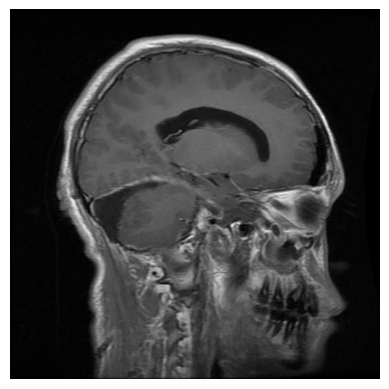

Consistently Misclassified Image at Index 46: /content/drive/MyDrive/thesis/final_data/meningioma_grey/Tr-me_1115.jpg


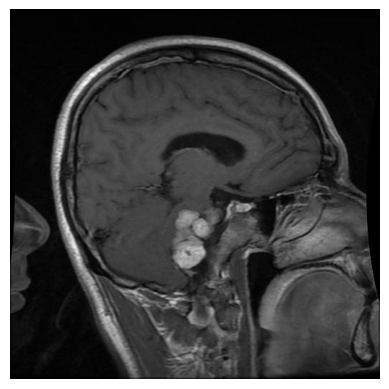

In [21]:
import cv2
import matplotlib.pyplot as plt

def load_and_display_image(image_path):
    # Load image using OpenCV (cv2)
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)  # Read image in grayscale

    if img is not None:
        # Display image using matplotlib
        plt.imshow(img, cmap='gray')  # Displaying in grayscale
        plt.axis('off')  # Turn off axis labels
        plt.show()
    else:
        print(f"Failed to load image: {image_path}")

# Assuming X_test contains paths to test image files
# Replace 'X_test' with your actual dataset containing test image paths

# Load and display consistently misclassified images
for idx in consistent_misclassified_indices:
    if idx < len(X_test):  # Ensure index is within bounds of X_test
        image_path = X_test[idx]
        print(f"Consistently Misclassified Image at Index {idx}: {image_path}")
        load_and_display_image(image_path)
    else:
        print(f"Index {idx} is out of bounds of the dataset")
